In [1]:
import os

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import nibabel as nib
import seaborn as sns

from nilearn import plotting
from nilearn.image import new_img_like

In [2]:
import rsatoolbox
from rsatoolbox.inference import eval_fixed
from rsatoolbox.model import ModelFixed, Model
from rsatoolbox.rdm import RDMs
from rsatoolbox.vis import show_rdm, show_rdm_panel

from rsatoolbox.util.searchlight import get_volume_searchlight, get_searchlight_RDMs, evaluate_models_searchlight
from glob import glob

In [3]:
def upper_tri(RDM):
    """upper_tri returns the upper triangular index of an RDM

    Args:
        RDM 2Darray: squareform RDM

    Returns:
        1D array: upper triangular vector of the RDM
    """
    # returns the upper triangle
    m = RDM.shape[0]
    r, c = np.triu_indices(m, 1)
    return RDM[r, c]

In [4]:
project_dir = os.path.join('/bgfs/bchandrasekaran/krs228/data/', 'FLT/')
fmriprep_dir = os.path.join(project_dir, 'derivatives', '22.1.1') # 'fmriprep_noSDC')

bidsroot = os.path.join(project_dir, 'data_bids') #'archive', 'data_bids_noIntendedFor')
deriv_dir = os.path.join(bidsroot, 'derivatives')

fwhm_sub = 0
model_dir = os.path.join(deriv_dir, 'nilearn', 'level-1_fwhm-{:.02f}'.format(fwhm_sub),)

task_list = ['tonecat']
space_label = 'MNI152NLin2009cAsym'

In [5]:
model_dir

'/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-0.00'

## Make models

In [6]:
pattern_descriptors = {'tone': ['T1', 'T1', 'T1', 'T1', 
                                'T2', 'T2', 'T2', 'T2', 
                                'T3', 'T3', 'T3', 'T3', 
                                'T4', 'T4', 'T4', 'T4', ],
                       'talker': ['M1', 'M2', 'F1', 'F2',
                                  'M1', 'M2', 'F1', 'F2',
                                  'M1', 'M2', 'F1', 'F2',
                                  'M1', 'M2', 'F1', 'F2', ],
                      }
                                  

### Stimulus RDMs

**THESE FILES HAVE BEEN REMOVED FROM CRC CLUSTER PER NIKE**

In [7]:
stim_rdm_dir = os.path.abspath('/bgfs/bchandrasekaran/ngg12/16tone/analysis_scripts/RDMs_kevin')

In [8]:
glob(stim_rdm_dir+'/STIM*')

[]

In [9]:
stim_rdm_files = sorted(glob(stim_rdm_dir+'/STIM*PCA*'))
n_rdms = len(stim_rdm_files)
stim_rdms_name_list = []
stim_rdms_array = np.zeros((n_rdms, 16, 16))
for i, fpath in enumerate(stim_rdm_files):
    rdm_name = os.path.basename(fpath)[5:-4]
    print(rdm_name)
    stim_rdm_data = np.genfromtxt(fpath, delimiter=',', skip_header=1)
    try:
        stim_rdms_array[i] = stim_rdm_data
        stim_rdms_name_list.append(rdm_name)
    except ValueError:
        # some of the DSMs are 4x4 instead of 16x16
        # so skip them
        continue

In [11]:
stim_rdms_array.shape

(6, 16, 16)

In [12]:
stim_rdms = RDMs(stim_rdms_array,
                  rdm_descriptors={'stimulus_model':stim_rdms_name_list,},
                  pattern_descriptors=pattern_descriptors,
                  dissimilarity_measure='Euclidean'
                  )

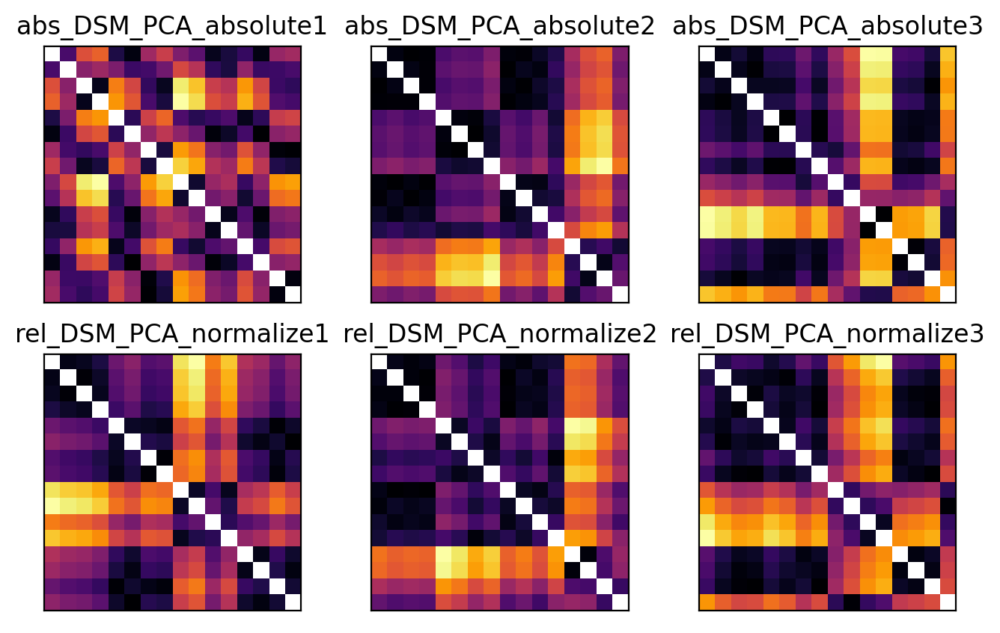

In [13]:
fig, axs = plt.subplots(2, 3, figsize=(8,5), dpi=200)
for dx, descrip in enumerate(stim_rdms.rdm_descriptors['stimulus_model']):
    spec_rdms = stim_rdms.subset('stimulus_model', descrip)
    show_rdm_panel(spec_rdms, ax=axs.flat[dx], rdm_descriptor='stimulus_model', cmap='inferno',)


#### Convert to models

In [14]:
stim_models = []
for dx, descrip in enumerate(stim_rdms.rdm_descriptors['stimulus_model']):
    spec_model = ModelFixed( '{} RDM'.format(descrip), stim_rdms.subset('stimulus_model', descrip))
    stim_models.append(spec_model)

### FFR RDMs


In [15]:
# start with grand average FFR
print('loading FFR dissimilarity matrix')
ffr_rdm_fpath = os.path.join(stim_rdm_dir, 'FFRdistancesgrandavg.csv')
rdm_name = 'FFR_grandavg'
ffr_rdm_data = np.genfromtxt(fpath, delimiter=',', skip_header=1)
print(len(ffr_rdm_data))

# input array needs to be 3-dimensional, despite docs saying 2-D is ok
# (thus the newaxis)
ffr_rdm = RDMs(ffr_rdm_data[np.newaxis,:,:],
               rdm_descriptors={'FFR model': rdm_name},
               pattern_descriptors=pattern_descriptors,
               dissimilarity_measure='Euclidean')
ffr_model = ModelFixed('FFR model', ffr_rdm)

ffr_models = [ffr_model]
    

loading FFR dissimilarity matrix
16


(<Figure size 144x144 with 1 Axes>,
 array([[<AxesSubplot: >]], dtype=object),
 defaultdict(dict,
             {<AxesSubplot: >: {'image': <matplotlib.image.AxesImage at 0x7f8d3c953fd0>}}))

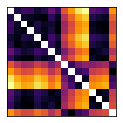

In [16]:
show_rdm(ffr_rdm, cmap='inferno',)

### Categorical RDMs

In [10]:
# make categorical RDMs
tone_rdm = np.array([[0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,],
                     [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,],
                     [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,],
                     [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,],
                     [1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,],
                     [1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,],
                     [1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,],
                     [1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,],
                     [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1,],
                     [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1,],
                     [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1,],
                     [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1,],
                     [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,],
                     [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,],
                     [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,],
                     [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,], ])

talker_rdm = np.array([[0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, ],
                       [1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, ],
                       [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, ],
                       [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, ],
                       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, ],
                       [1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, ],
                       [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, ],
                       [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, ],
                       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, ],
                       [1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, ],
                       [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, ],
                       [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, ],
                       [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, ],
                       [1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, ],
                       [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, ],
                       [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, ], ])

rdms_array = np.array([tone_rdm, talker_rdm])

In [11]:
cat_rdms = RDMs(rdms_array,
                  rdm_descriptors={'categorical_model':['tone', 'talker'],},
                  pattern_descriptors=pattern_descriptors,
                  dissimilarity_measure='Euclidean'
                 )

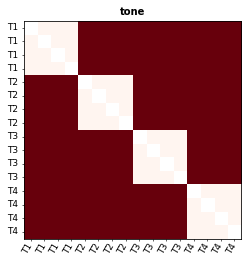

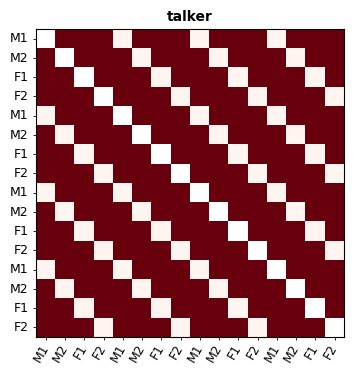

In [12]:
tone_rdms = cat_rdms.subset('categorical_model','tone')
fig, ax, ret_val = show_rdm(tone_rdms, rdm_descriptor='categorical_model', 
                            pattern_descriptor='tone', cmap='Reds', figsize=(4,4))

talker_rdms = cat_rdms.subset('categorical_model','talker')
fig, ax, ret_val = show_rdm(talker_rdms, rdm_descriptor='categorical_model', 
                            pattern_descriptor='talker', cmap='Reds', figsize=(4,4))

In [13]:
cat_rdms.dissimilarities.shape

(2, 120)

#### Convert from RDM to Model

In [14]:
tone_model = ModelFixed( 'Tone RDM', cat_rdms.subset('categorical_model', 'tone'))
talker_model = ModelFixed( 'Talker RDM', cat_rdms.subset('categorical_model', 'talker'))
cat_models = [tone_model, talker_model]

In [15]:
tone_model.name

'Tone RDM'

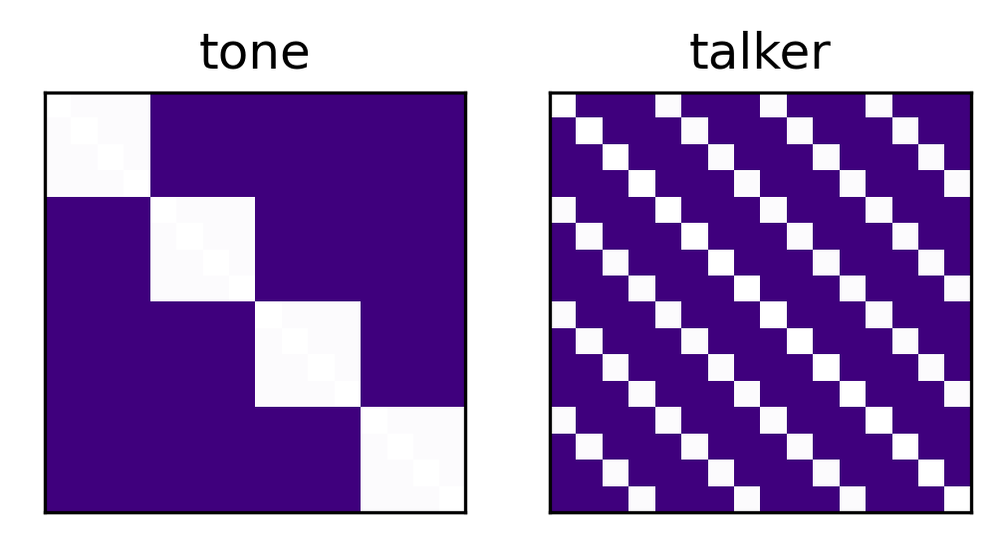

In [19]:
fig, axs = plt.subplots(1, 2, figsize=(4,2), dpi=300)

#show_rdm_panel(ffr_rdm, ax=axs.flat[0], rdm_descriptor='FFR model', cmap='inferno',)
show_rdm_panel(tone_rdms, ax=axs.flat[0], rdm_descriptor='categorical_model', cmap='Purples',)
show_rdm_panel(talker_rdms, ax=axs.flat[1], rdm_descriptor='categorical_model', cmap='Purples',)


### Merge model lists

In [24]:
all_models = stim_models + ffr_models + cat_models

In [25]:
[print(x.name) for x in all_models];

abs_DSM_PCA_absolute1 RDM
abs_DSM_PCA_absolute2 RDM
abs_DSM_PCA_absolute3 RDM
rel_DSM_PCA_normalize1 RDM
rel_DSM_PCA_normalize2 RDM
rel_DSM_PCA_normalize3 RDM
FFR model
Tone RDM
Talker RDM


## Set up participants

In [26]:
participants_fpath = os.path.join(bidsroot, 'participants.tsv')
participants_df = pd.read_csv(participants_fpath, sep='\t')

# subjects to ignore (not fully processed, etc.)
ignore_subs = [
                'sub-FLT27', 
              ]
participants_df.drop(participants_df[participants_df.participant_id.isin(ignore_subs)].index,
                     inplace=True)

# re-sort by participant ID
participants_df.sort_values(by=['participant_id'], 
                            ignore_index=True, 
                            inplace=True)

In [27]:
participants_df

,participant_id,age,sex,group,FFR_id
0,sub-FLT02,21,F,non-Mandarin,1002.0
1,sub-FLT03,25,F,Mandarin,2002.0
2,sub-FLT04,21,F,non-Mandarin,1003.0
3,sub-FLT05,26,M,Mandarin,3010.0
4,sub-FLT06,21,F,non-Mandarin,3001.0
5,sub-FLT07,22,M,Mandarin,2003.0
6,sub-FLT08,23,F,Mandarin,2005.0
7,sub-FLT09,30,F,non-Mandarin,3002.0
8,sub-FLT10,23,F,Mandarin,2006.0
9,sub-FLT11,20,F,non-Mandarin,1005.0


In [28]:
# create group-specific lists of subject IDs
sub_group_dict = {'Mandarin': list(participants_df.participant_id[participants_df.group=='Mandarin']),
                  'non-Mandarin': list(participants_df.participant_id[participants_df.group=='non-Mandarin'])}

In [29]:
len(sub_group_dict['Mandarin'])

14

In [30]:
sub_group_dict

{'Mandarin': ['sub-FLT03',
  'sub-FLT05',
  'sub-FLT07',
  'sub-FLT08',
  'sub-FLT10',
  'sub-FLT15',
  'sub-FLT17',
  'sub-FLT18',
  'sub-FLT19',
  'sub-FLT21',
  'sub-FLT22',
  'sub-FLT23',
  'sub-FLT24',
  'sub-FLT26'],
 'non-Mandarin': ['sub-FLT02',
  'sub-FLT04',
  'sub-FLT06',
  'sub-FLT09',
  'sub-FLT11',
  'sub-FLT12',
  'sub-FLT13',
  'sub-FLT14',
  'sub-FLT20',
  'sub-FLT25',
  'sub-FLT28',
  'sub-FLT30']}

In [31]:
mask_list = [#'mask-L-CN', 'mask-L-SOC', 
             'mask-L-IC', 'mask-L-MGN', 'mask-L-HG', 'mask-L-PP', 'mask-L-PT', 
             'mask-L-STGp', 'mask-L-STGa', 'mask-L-ParsOp', 'mask-L-ParsTri',
             #'mask-R-CN', 'mask-R-SOC', 
             'mask-R-IC', 'mask-R-MGN', 'mask-R-HG', 'mask-R-PP', 'mask-R-PT', 
             'mask-R-STGp', 'mask-R-STGa', 'mask-R-ParsOp', 'mask-R-ParsTri',]

In [32]:
participant_list = participants_df.participant_id
participant_list = [p.split('-')[1] for p in participant_list]
group_assignment = participants_df.group

In [33]:
statmap = 'tstat' # 'beta'

## Run-specific

In [34]:
model_dir

'/bgfs/bchandrasekaran/krs228/data/FLT/data_bids/derivatives/nilearn/level-1_fwhm-0.00'

### ARCHIVE: Generate run-specific RDMs

In [33]:
'''
group_rdm_list = []
for sx, sub_id in enumerate(participant_list):
    print(sub_id)
    group_id = group_assignment[sx]

    # set this path to wherever you saved the folder containing the img-files
    model_folder = os.path.join(model_dir, 'masked_statmaps',
                               'sub-{}'.format(sub_id),
                               'statmaps_masked',
                               'stimulus_per_run_LSS')
    for runx, data_folder in enumerate(sorted(glob('{}/run*'.format(model_folder)))):
        #print(data_folder)
        
        #mask_list = np.unique([os.path.basename(x).split('_')[2] for x in all_im_paths])

        all_mask_data = []
        for mx, mask_descrip in enumerate(mask_list):

            #print(mask_descrip)
            image_paths = sorted(glob('{}/{}/*_cond-*_map-{}.csv'.format(data_folder, mask_descrip, statmap)))

            mask_fpath = os.path.join(deriv_dir, 'nilearn', 'masks', 'sub-{}'.format(sub_id),
                                      'space-{}'.format(space_label), 'masks-dseg',
                                      'sub-{}_space-{}_mask-gm.nii.gz'.format(sub_id, space_label))

            try:
                n_vox = np.genfromtxt(image_paths[0]).shape[0]
            except IndexError:
                n_vox = 1

            data = np.zeros((len(image_paths), n_vox))
            for x, im in enumerate(image_paths):
                data[x] = np.genfromtxt(im)
            all_mask_data.append(data)

            roi_rdms = []
        for rx, mask_data in enumerate(all_mask_data):
            dataset = rsatoolbox.data.Dataset(mask_data, 
                                              descriptors={'participant': sub_id, 
                                                           'run': os.path.basename(data_folder),
                                                           'ROI': mask_list[rx], 
                                                           'group': group_id
                                                          },)
            test_rdm = rsatoolbox.rdm.calc_rdm(dataset)
            roi_rdms.append(test_rdm)
            group_rdm_list.append(test_rdm)

        concat_rdms = rsatoolbox.rdm.rdms.concat(roi_rdms)
group_rdms = rsatoolbox.rdm.rdms.concat(group_rdm_list)

group_rdms.pattern_descriptors = pattern_descriptors

group_rdms.save('group_run_LSS_rdms.hdf5', file_type='hdf5', overwrite=True)
'''

### Load pre-saved run-specific RDMs

In [35]:
group_rdms = rsatoolbox.rdm.rdms.load_rdm('group_run_LSS_rdms.hdf5')

### Create group-mean RDMs

In [36]:
mean_rdms_mand_list = []
mean_rdms_nman_list = []
for runx, run in enumerate(np.unique(group_rdms.rdm_descriptors['run'])):
    for rx, roi in enumerate(mask_list):
        # Mandarin-speaking
        dissim_mand = group_rdms.subset('group', value='Mandarin').subset('run', value=run).subset('ROI', value=roi).dissimilarities

        roi_mand = RDMs(dissim_mand.mean(axis=0),
                        rdm_descriptors={'run': run, 'ROI': mask_list[rx], 'group': 'Mandarin'},
                        pattern_descriptors=pattern_descriptors)
        mean_rdms_mand_list.append(roi_mand)

        # non-Mandarin-speaking
        dissim_nman = group_rdms.subset('group', value='non-Mandarin').subset('run', value=run).subset('ROI', value=roi).dissimilarities
        roi_nman = RDMs(dissim_nman.mean(axis=0),
                        rdm_descriptors={'run': run, 'ROI': mask_list[rx], 'group': 'non-Mandarin'},
                        pattern_descriptors=pattern_descriptors)
        mean_rdms_nman_list.append(roi_nman)

mean_rdms_mand = rsatoolbox.rdm.rdms.concat(mean_rdms_mand_list)
mean_rdms_nman = rsatoolbox.rdm.rdms.concat(mean_rdms_nman_list)



In [37]:
mean_rdms_mand

rsatoolbox.rdm.RDMs(
dissimilarity_measure = 
None
dissimilarities = 
[[2.18434469 2.16593166 1.71754503 ... 1.64891619 2.0924978  1.91266717]
 [2.24480756 2.12806912 2.00712243 ... 2.41159459 2.52758356 2.16290508]
 [2.3028531  2.16342697 2.05838177 ... 2.16271216 2.17274798 2.16089866]
 ...
 [2.33004238 2.27638168 2.32752825 ... 2.00584334 2.37240804 2.01215973]
 [2.41159076 2.38467481 2.47870339 ... 2.16319079 2.40912419 2.06779915]
 [2.42380789 2.32801541 2.47918812 ... 2.1073666  2.41325774 2.00063277]]
descriptors = 
{}
rdm_descriptors = 
{'run': ['run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02',

In [38]:
roi_nman

rsatoolbox.rdm.RDMs(
dissimilarity_measure = 
None
dissimilarities = 
[[2.11620942 2.51623068 2.21551585 2.206491   2.28321651 2.39537117
  2.4239784  2.47456386 2.51189178 2.37428917 2.34755621 2.26645093
  2.27288491 2.07868973 2.17852904 2.28111762 2.02499208 2.31754336
  2.3278129  2.45927306 2.42071466 2.25976866 2.25859572 2.18913234
  2.2368025  2.11029358 2.34758556 2.23548519 1.98643926 2.33265445
  2.48230236 2.3905919  2.37069173 2.47786442 2.5550714  2.35274679
  2.14709608 2.4367345  2.35262599 2.28946262 2.42480373 2.23056964
  2.23221674 2.10342816 2.49500179 2.29281    2.27955708 2.1400771
  2.11761661 2.05648456 1.85743757 1.99869579 2.14231642 1.9863252
  2.45599253 2.1484957  2.18938893 2.52455874 2.4529001  2.31547966
  2.27230386 2.17920833 2.28158213 2.29126642 2.21390148 2.27989331
  2.20306082 2.40677368 2.35442162 2.24175524 2.2891203  1.97253797
  2.01255953 2.19587158 2.17338688 2.44992116 2.51377977 2.55556142
  2.17442615 2.64116945 2.43021225 2.35368172 2.

### plot data RDMs

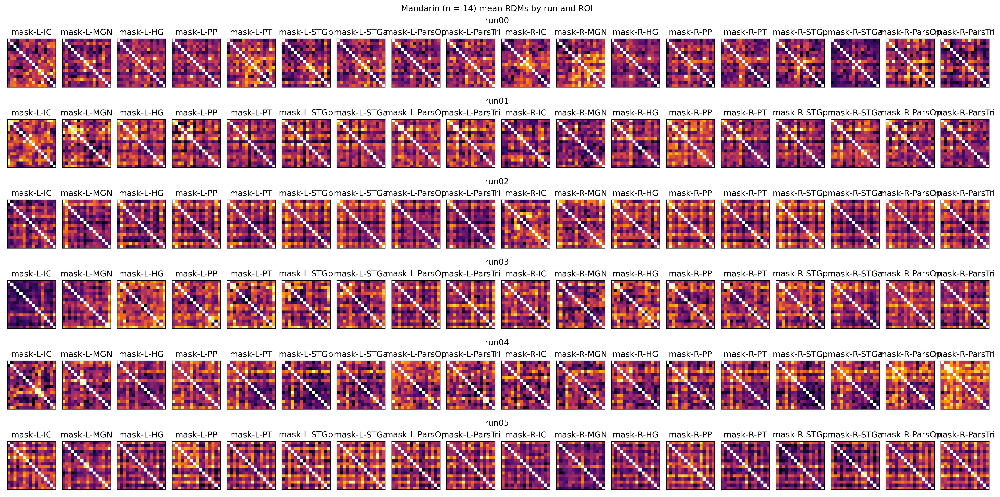

In [43]:
n_mand = len(sub_group_dict['Mandarin'])

fig = plt.figure(constrained_layout=True, figsize=(20,10), dpi=300)
fig.suptitle('Mandarin (n = {}) mean RDMs by run and ROI'.format(n_mand))

subfigs = fig.subfigures(nrows=6, ncols=1)


for sf, run in enumerate(np.unique(group_rdms.rdm_descriptors['run'])):
    subfigs[sf].suptitle(run)

    axs = subfigs[sf].subplots(nrows=1, ncols=len(mask_list))
    for rx, roi in enumerate(mask_list):
        rsatoolbox.vis.show_rdm_panel(mean_rdms_mand.subset('run', value=run).subset('ROI', value=roi), 
                                      rdm_descriptor='ROI', 
                                      cmap='inferno', 
                                      ax=axs[rx])

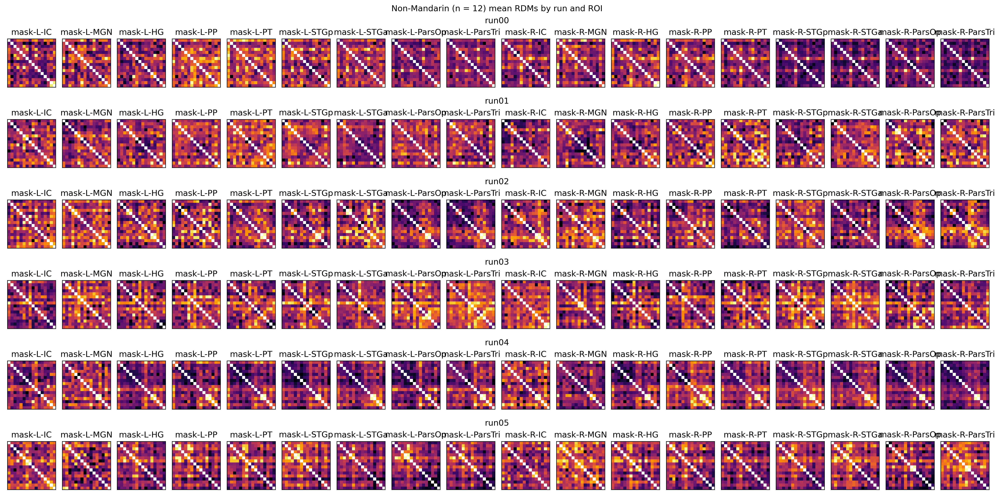

In [44]:
n_nman = len(sub_group_dict['non-Mandarin'])

fig = plt.figure(constrained_layout=True, figsize=(20,10), dpi=300)
fig.suptitle('Non-Mandarin (n = {}) mean RDMs by run and ROI'.format(n_nman))

subfigs = fig.subfigures(nrows=6, ncols=1)

for sf, run in enumerate(np.unique(group_rdms.rdm_descriptors['run'])):
    subfigs[sf].suptitle(run)

    axs = subfigs[sf].subplots(nrows=1, ncols=len(mask_list))
    for rx, roi in enumerate(mask_list):
        rsatoolbox.vis.show_rdm_panel(mean_rdms_nman.subset('run', value=run).subset('ROI', value=roi), 
                                      rdm_descriptor='ROI', 
                                      cmap='inferno', 
                                      ax=axs[rx])

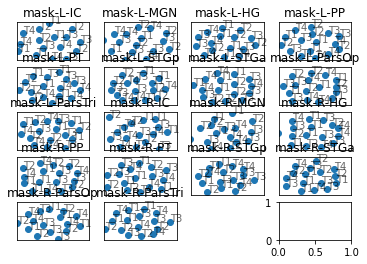

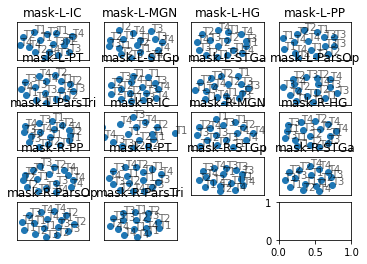

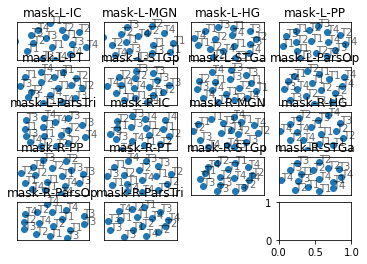

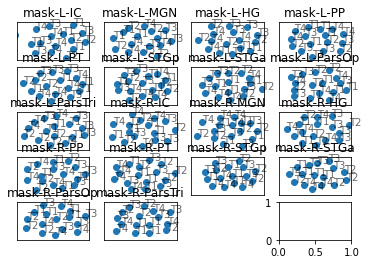

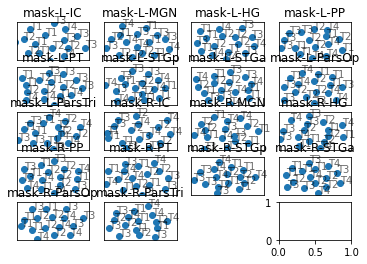

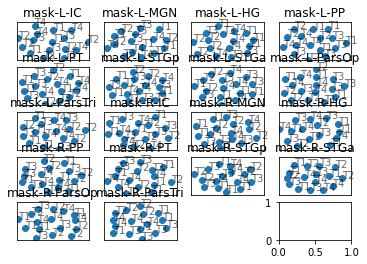

In [45]:
for sf, run in enumerate(np.unique(group_rdms.rdm_descriptors['run'])):
    rsatoolbox.vis.scatter_plot.show_MDS(mean_rdms_nman.subset('run', run), 
                                         rdm_descriptor='ROI',
                                         pattern_descriptor='tone');

## Run-specific RSA

### Each run independently

In [54]:
len(group_rdms.get_matrices()[0])

16

In [55]:
len(group_rdms.subset('group', value='Mandarin').subset('run', value='run05'))

252

In [57]:
len(all_models)

9

group-non-Mandarin run-run00 ROI-mask-L-HG
group-non-Mandarin run-run05 ROI-mask-L-HG
group-non-Mandarin run-run00 ROI-mask-L-IC
group-non-Mandarin run-run05 ROI-mask-L-IC
group-non-Mandarin run-run00 ROI-mask-L-MGN
group-non-Mandarin run-run05 ROI-mask-L-MGN
group-non-Mandarin run-run00 ROI-mask-L-PP
group-non-Mandarin run-run05 ROI-mask-L-PP
group-non-Mandarin run-run00 ROI-mask-L-PT
group-non-Mandarin run-run05 ROI-mask-L-PT
group-non-Mandarin run-run00 ROI-mask-L-ParsOp
group-non-Mandarin run-run05 ROI-mask-L-ParsOp
group-non-Mandarin run-run00 ROI-mask-L-ParsTri
group-non-Mandarin run-run05 ROI-mask-L-ParsTri
group-non-Mandarin run-run00 ROI-mask-L-STGa
group-non-Mandarin run-run05 ROI-mask-L-STGa
group-non-Mandarin run-run00 ROI-mask-L-STGp
group-non-Mandarin run-run05 ROI-mask-L-STGp
group-non-Mandarin run-run00 ROI-mask-R-HG
group-non-Mandarin run-run05 ROI-mask-R-HG
group-non-Mandarin run-run00 ROI-mask-R-IC
group-non-Mandarin run-run05 ROI-mask-R-IC
group-non-Mandarin run-run

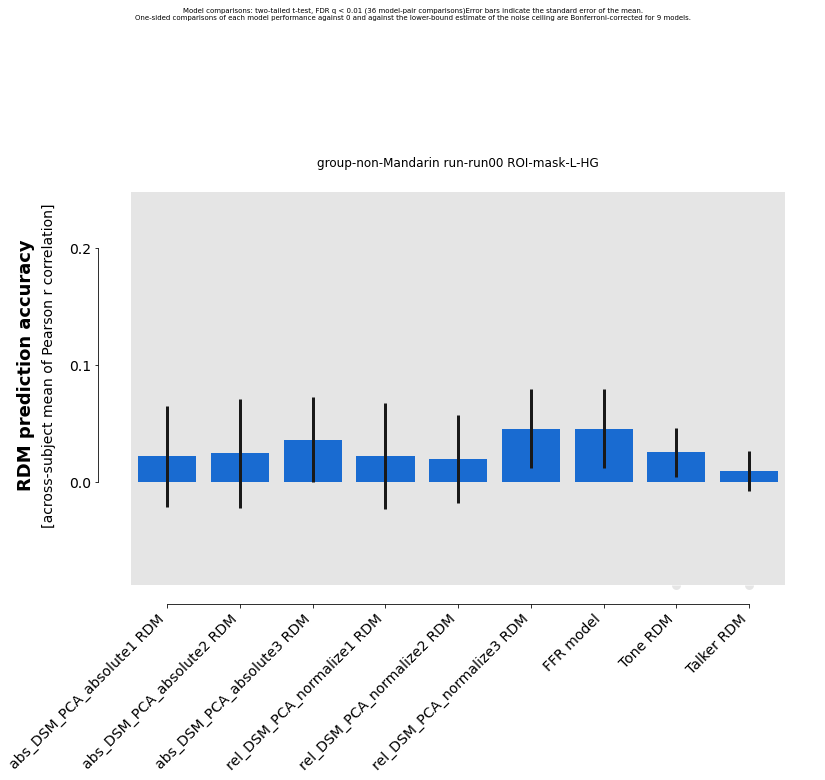

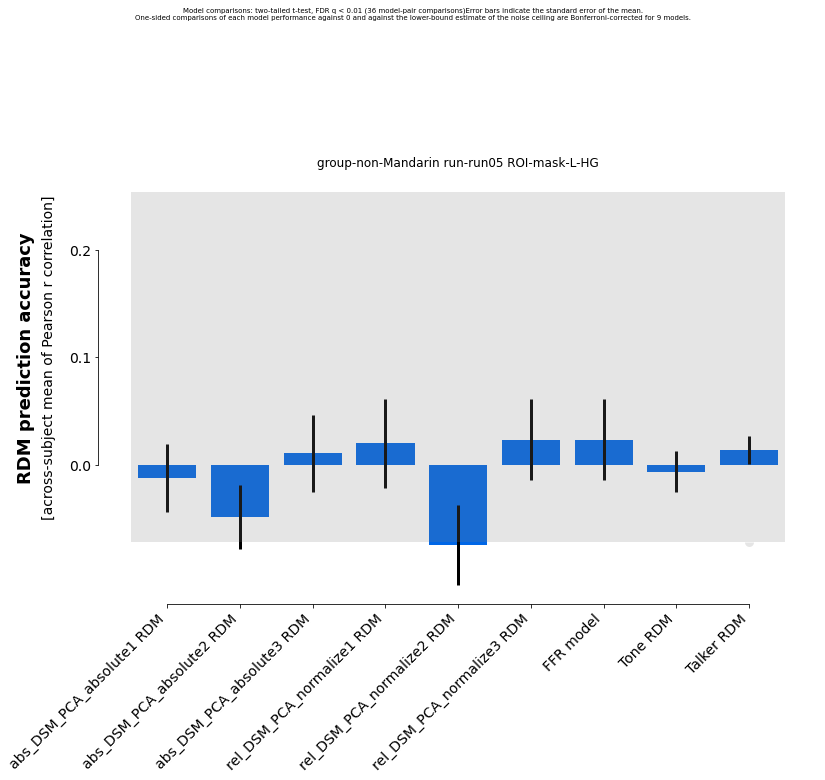

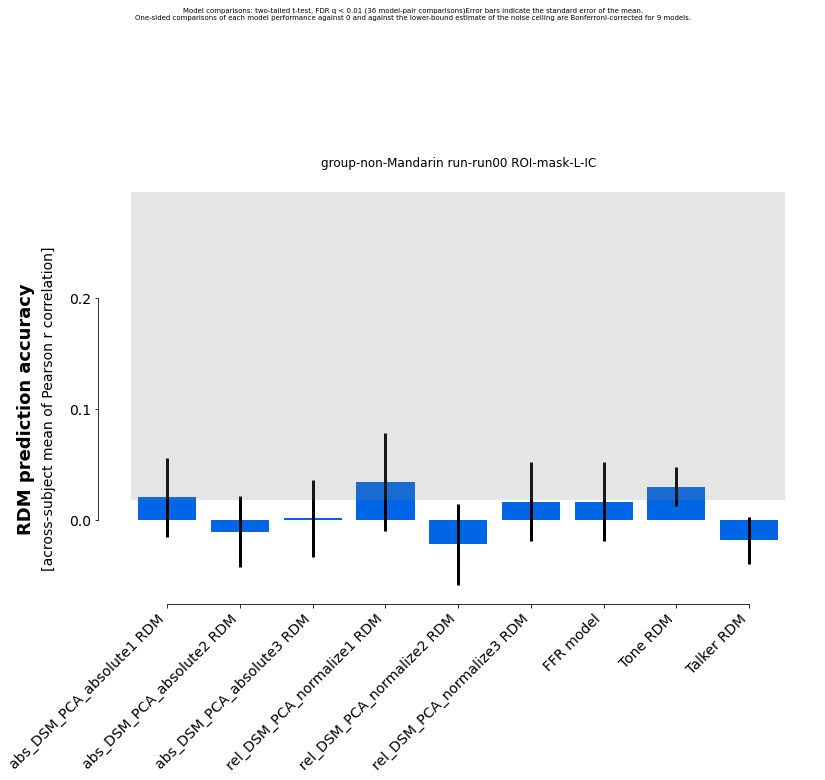

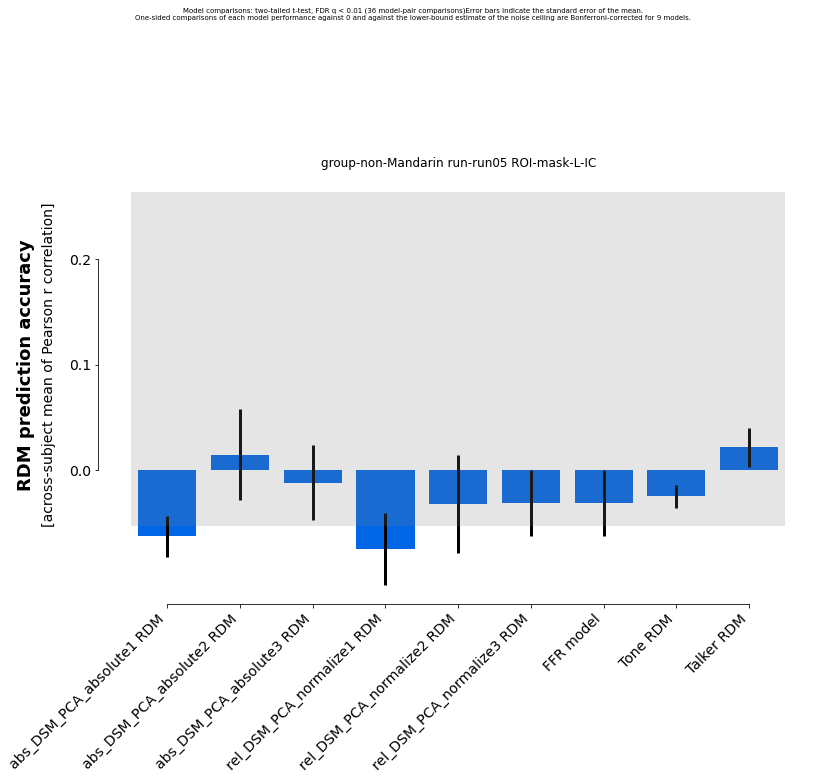

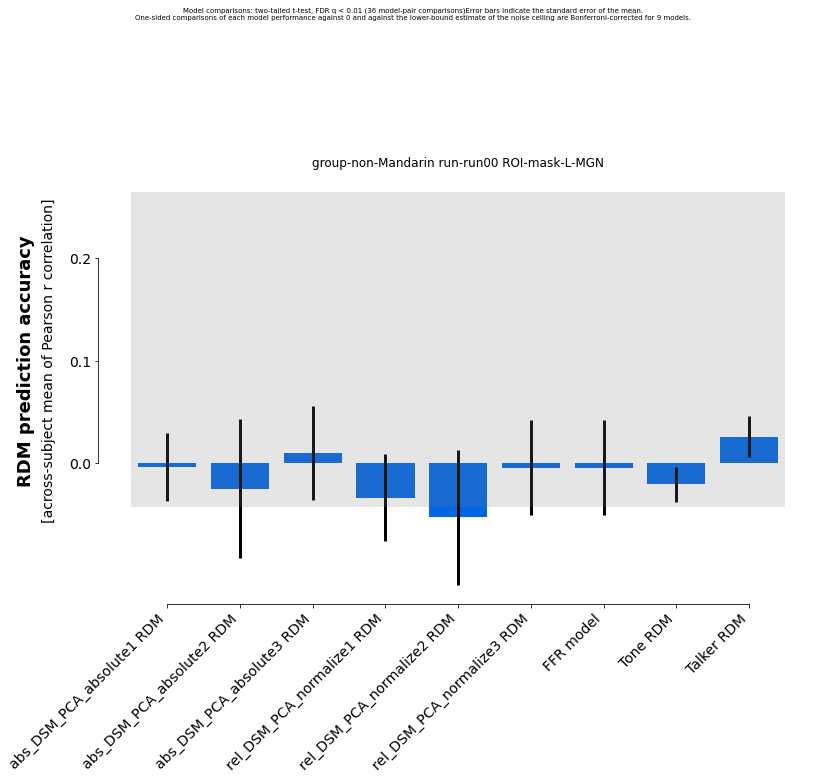

...

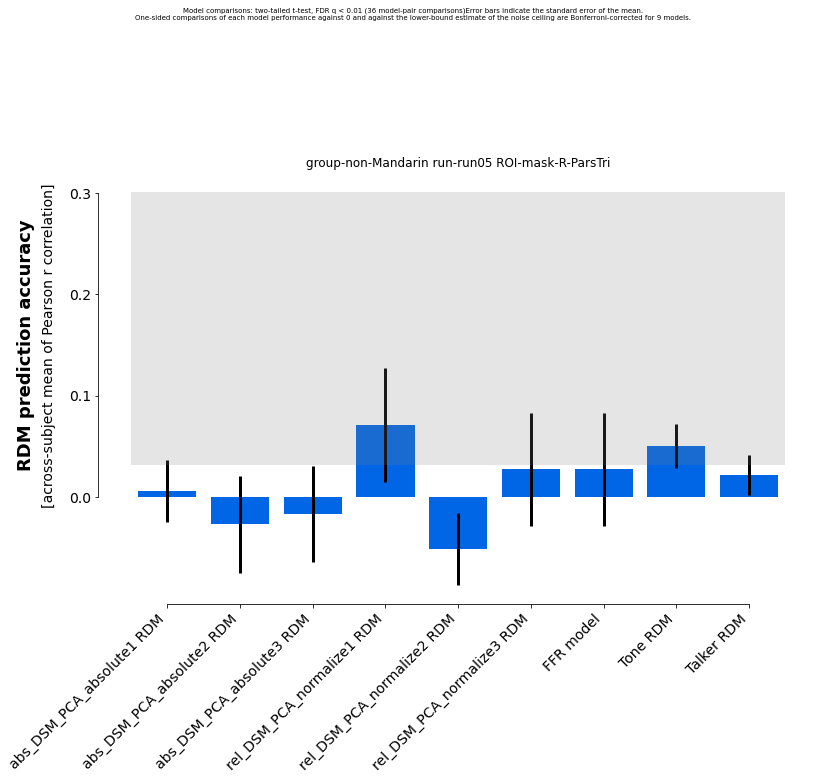

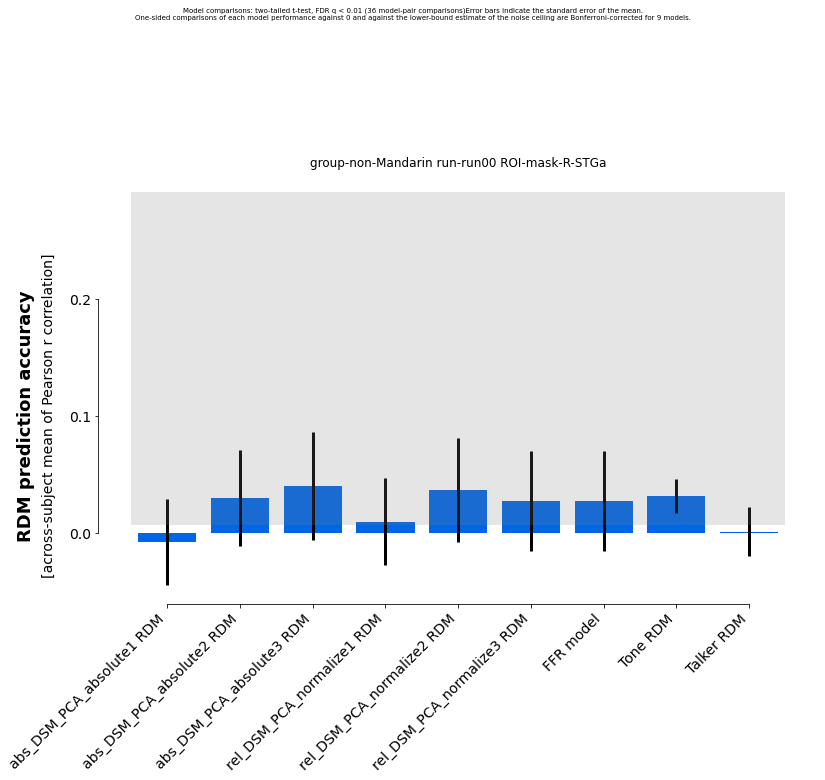

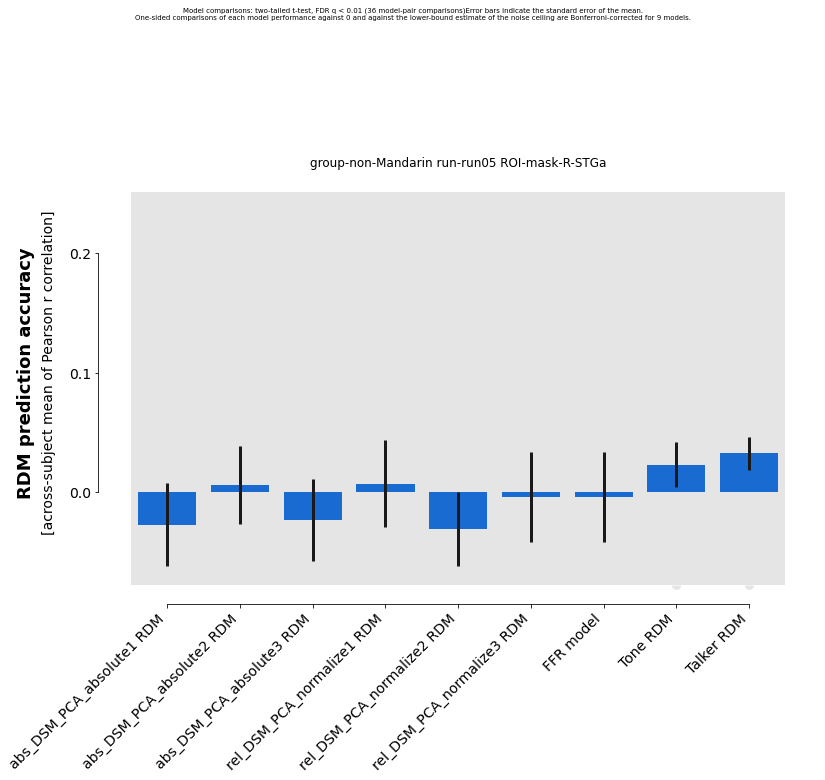

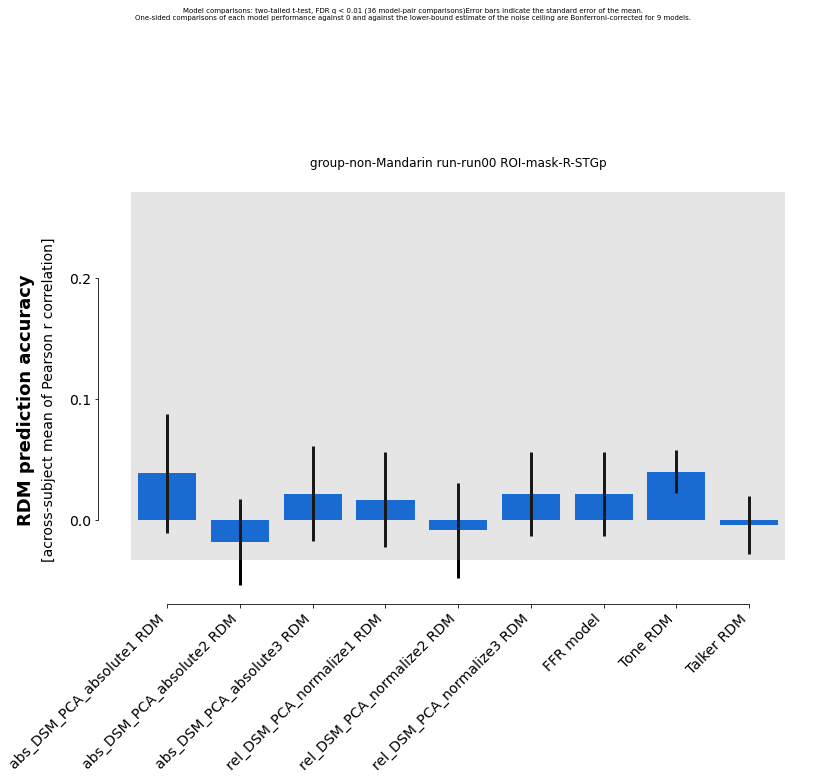

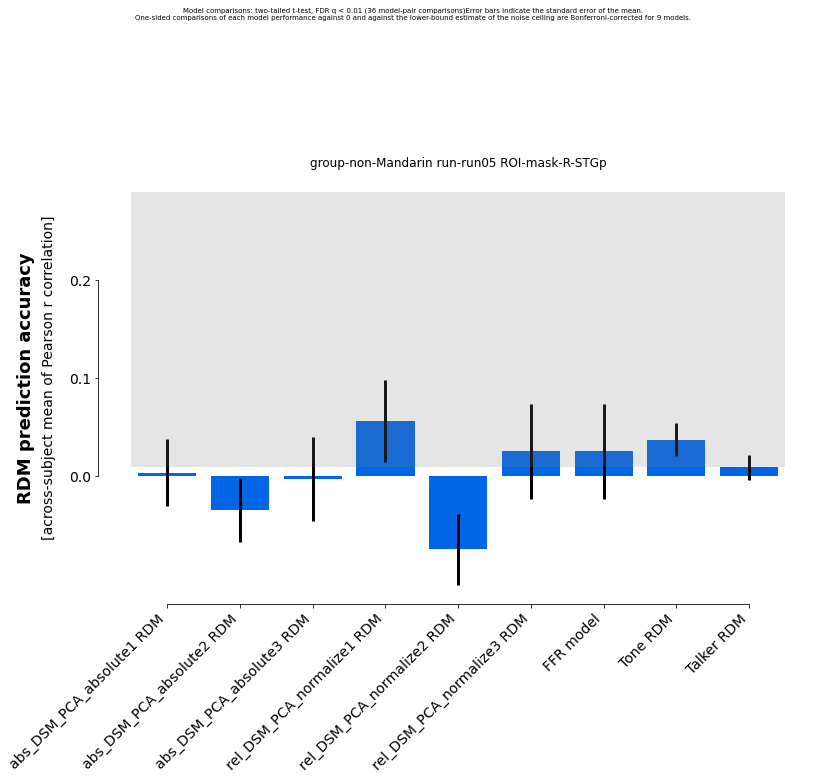

In [62]:
'''
group = 'Mandarin'
run = 'run00'
ROI = 'mask-R-ParsTri'
'''
for group in ['non-Mandarin']:#np.unique(group_rdms.rdm_descriptors['group']):
    #for run in np.unique(group_rdms.rdm_descriptors['run']):
    for ROI in np.unique(group_rdms.rdm_descriptors['ROI']):
        for run in ['run00', 'run05']:
            print(f'group-{group} run-{run} ROI-{ROI}')
            results_grr = rsatoolbox.inference.eval_fixed(all_models, 
                                                          group_rdms.subset('group', value=group).subset('run',value=run).subset('ROI',value=ROI),  
                                                          method='corr',)
            fig, ax1, ax2 = rsatoolbox.vis.plot_model_comparison(results_grr);
            ax1.set_title(f'group-{group} run-{run} ROI-{ROI}');
            ax1.axes.set_xticklabels(ax1.xaxis.get_majorticklabels(), ha="right")

            #results_grr.save(f'results-eval/results-eval_group-{group}_run-{run}_ROI-{ROI}.hdf5',overwrite=True)

In [63]:
print(results_grr)

Results for running fixed evaluation for corr on 9 models:

Model                      |   Eval ± SEM   | p (against 0) | p (against NC) |
------------------------------------------------------------------------------
abs_DSM_PCA_absolute1 RDM  |  0.003 ± 0.034 |        0.465  |         0.874  |
abs_DSM_PCA_absolute2 RDM  | -0.035 ± 0.033 |        0.844  |         0.213  |
abs_DSM_PCA_absolute3 RDM  | -0.003 ± 0.043 |        0.528  |         0.789  |
rel_DSM_PCA_normalize1 RDM |  0.056 ± 0.042 |        0.102  |         0.277  |
rel_DSM_PCA_normalize2 RDM | -0.075 ± 0.036 |        0.969  |         0.040  |
rel_DSM_PCA_normalize3 RDM |  0.025 ± 0.049 |        0.308  |         0.741  |
FFR model                  |  0.025 ± 0.049 |        0.308  |         0.741  |
Tone RDM                   |  0.037 ± 0.017 |        0.027  |         0.125  |
Talker RDM                 |  0.008 ± 0.013 |        0.261  |         0.993  |

p-values are based on uncorrected t-tests


### Combine runs 1–2, 3–4, and 5–6

In [33]:
runcombo_dict = {'early': ['run00', 'run01'], 'middle': ['run02', 'run03'], 'final': ['run04','run05']}

In [34]:
runcombo_dict

{'early': ['run00', 'run01'],
 'middle': ['run02', 'run03'],
 'final': ['run04', 'run05']}

In [37]:
for x in runcombo_dict:
    print(runcombo_dict[x])

['run00', 'run01']
['run02', 'run03']
['run04', 'run05']


group-non-Mandarin runcombo-early ROI-mask-L-HG
group-non-Mandarin runcombo-middle ROI-mask-L-HG
group-non-Mandarin runcombo-final ROI-mask-L-HG
group-non-Mandarin runcombo-early ROI-mask-L-IC
group-non-Mandarin runcombo-middle ROI-mask-L-IC
group-non-Mandarin runcombo-final ROI-mask-L-IC
group-non-Mandarin runcombo-early ROI-mask-L-MGN
group-non-Mandarin runcombo-middle ROI-mask-L-MGN
group-non-Mandarin runcombo-final ROI-mask-L-MGN
group-non-Mandarin runcombo-early ROI-mask-L-PP
group-non-Mandarin runcombo-middle ROI-mask-L-PP
group-non-Mandarin runcombo-final ROI-mask-L-PP
group-non-Mandarin runcombo-early ROI-mask-L-PT
group-non-Mandarin runcombo-middle ROI-mask-L-PT
group-non-Mandarin runcombo-final ROI-mask-L-PT
group-non-Mandarin runcombo-early ROI-mask-L-ParsOp
group-non-Mandarin runcombo-middle ROI-mask-L-ParsOp
group-non-Mandarin runcombo-final ROI-mask-L-ParsOp
group-non-Mandarin runcombo-early ROI-mask-L-ParsTri
group-non-Mandarin runcombo-middle ROI-mask-L-ParsTri
group-no

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/rsatoolbox/vis/model_plot.py:282: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12.5, 10))


ValueError: zero-size array to reduction operation maximum which has no identity

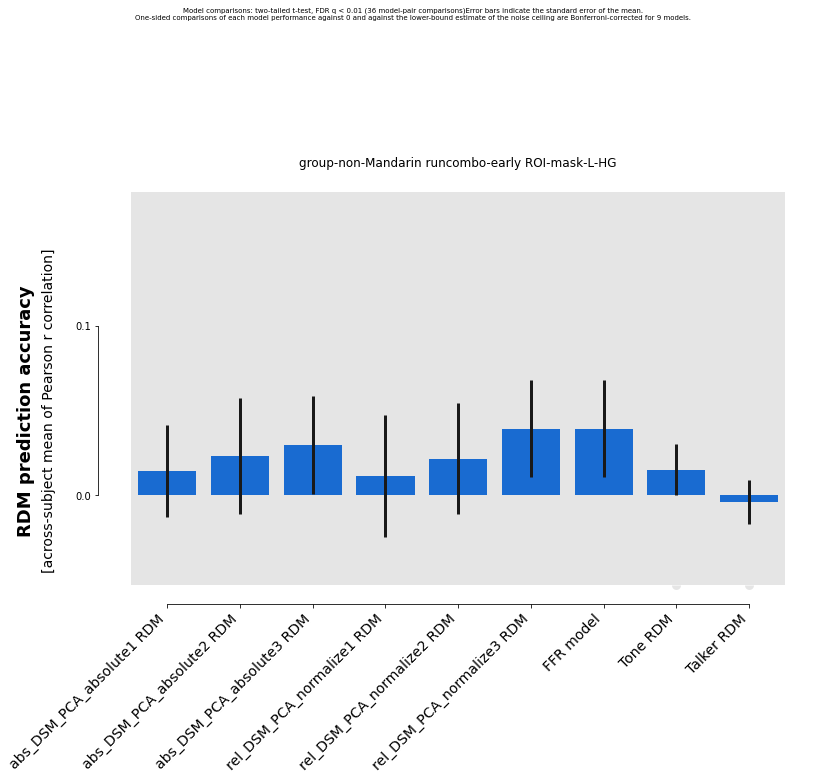

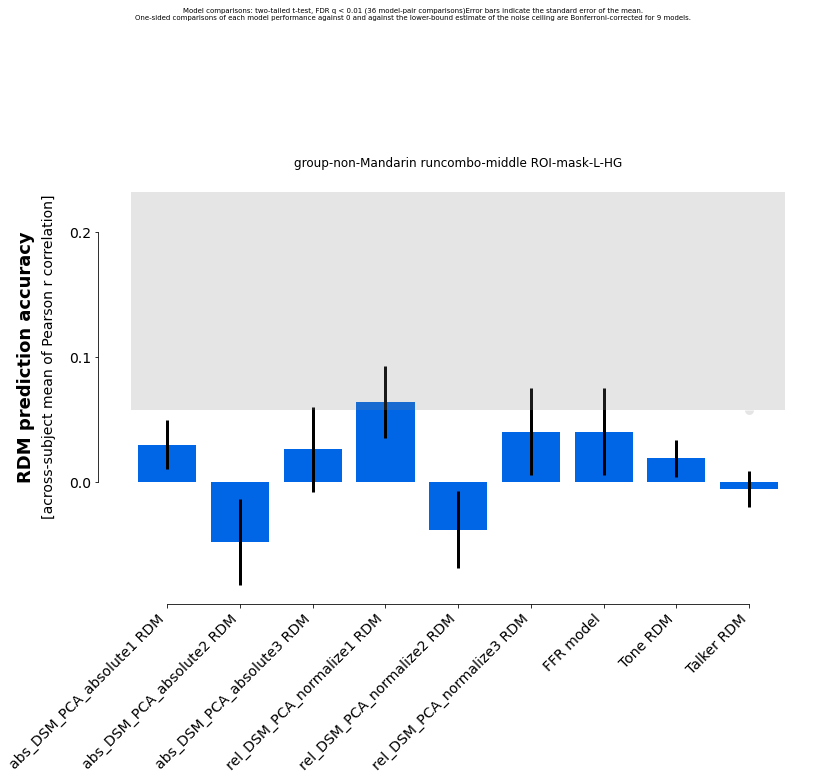

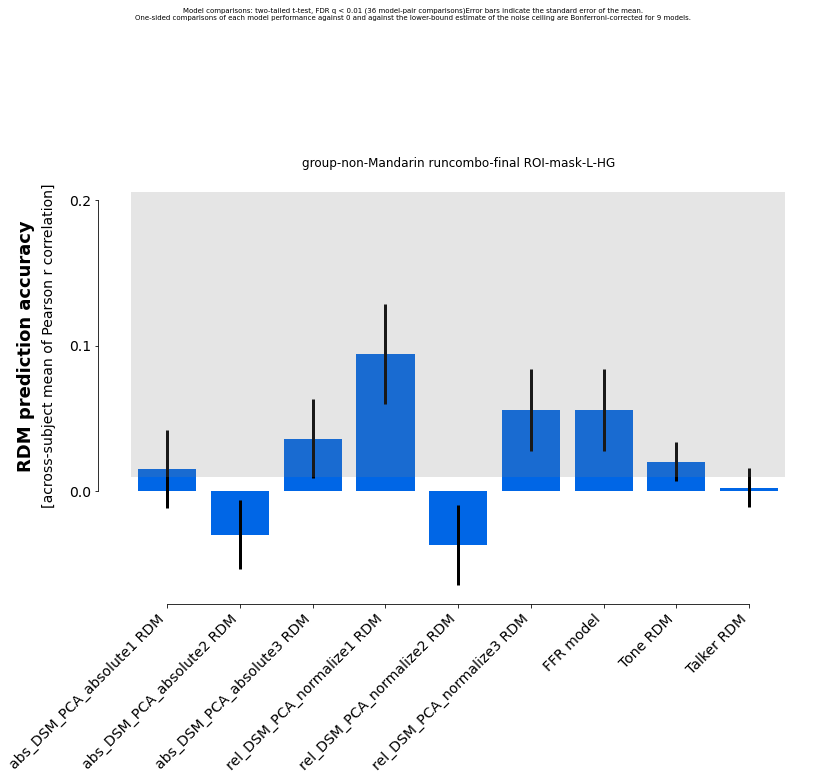

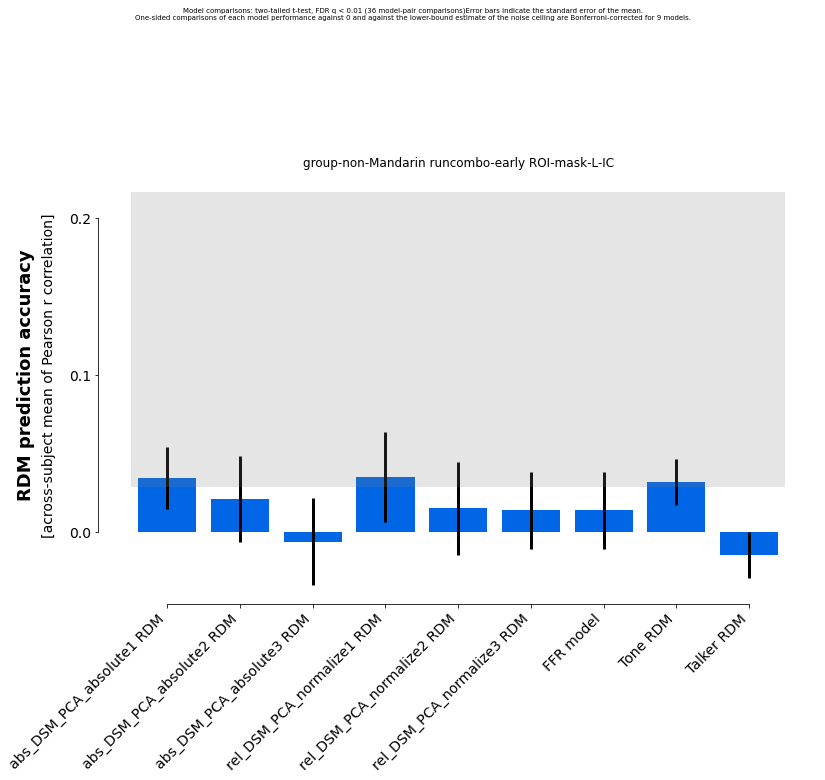

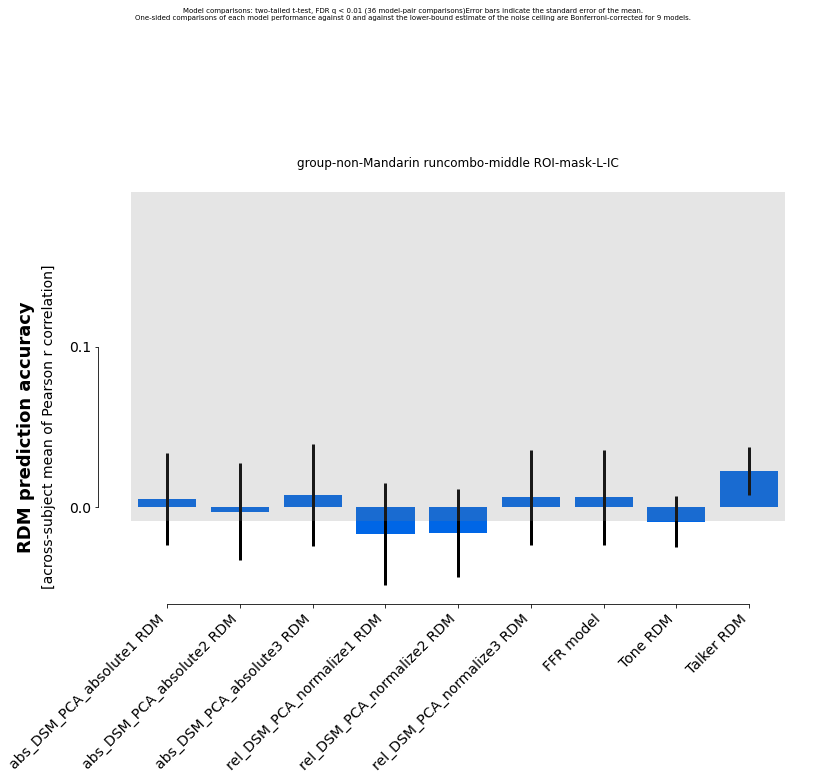

...

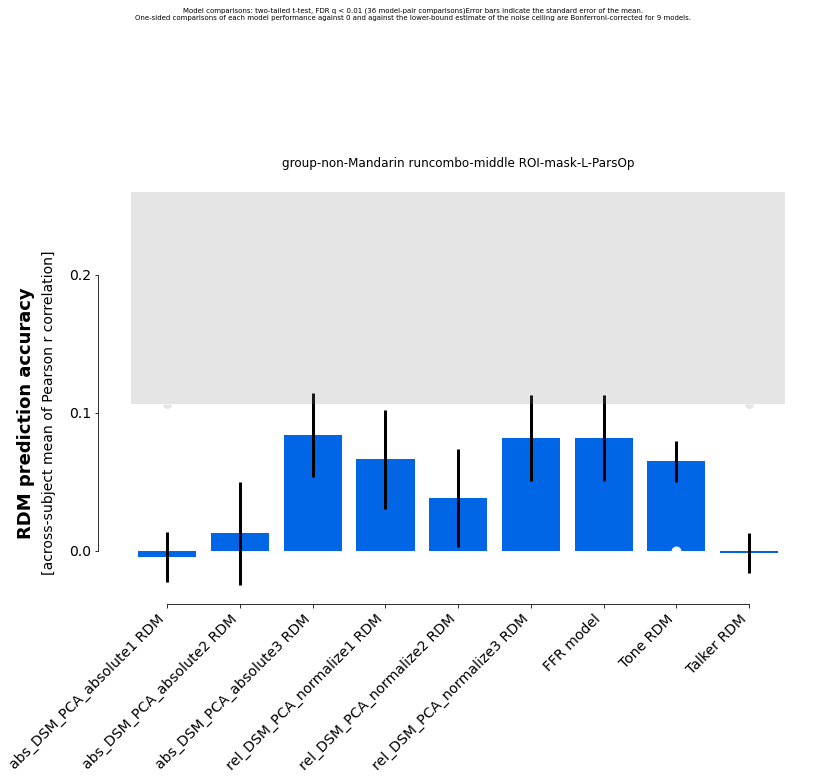

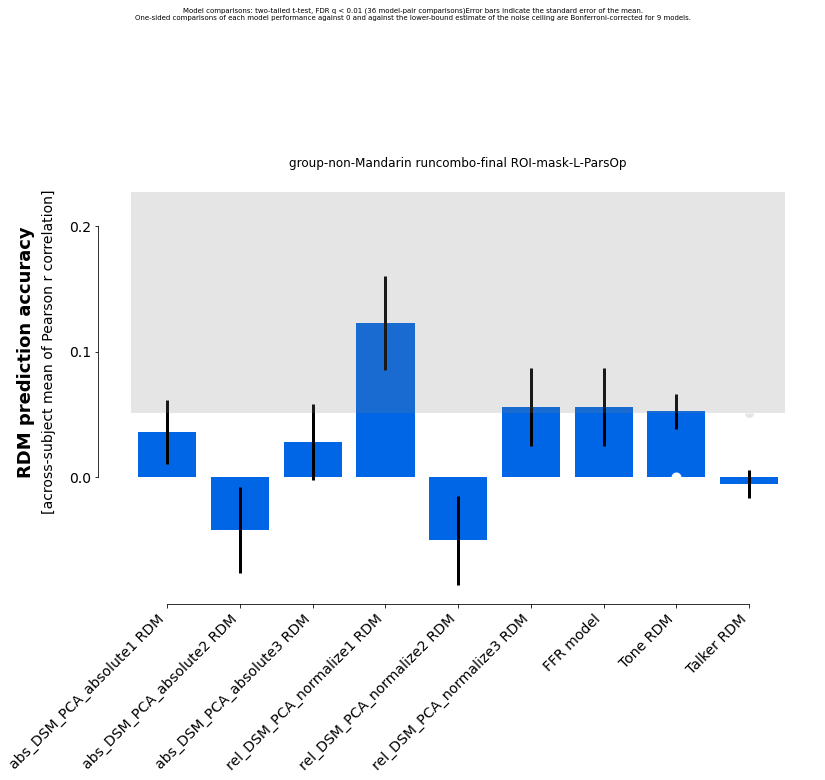

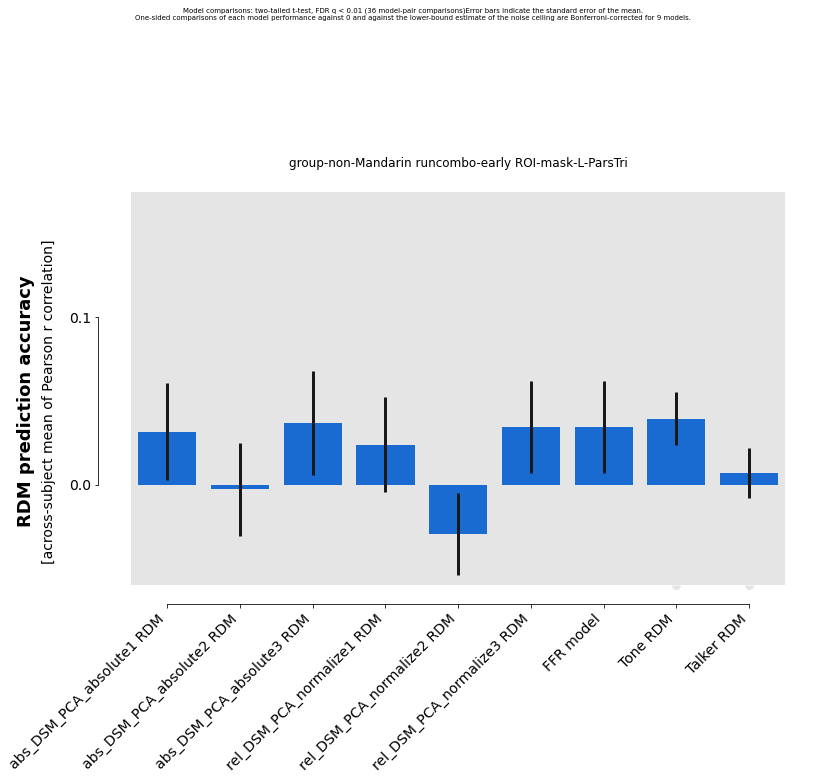

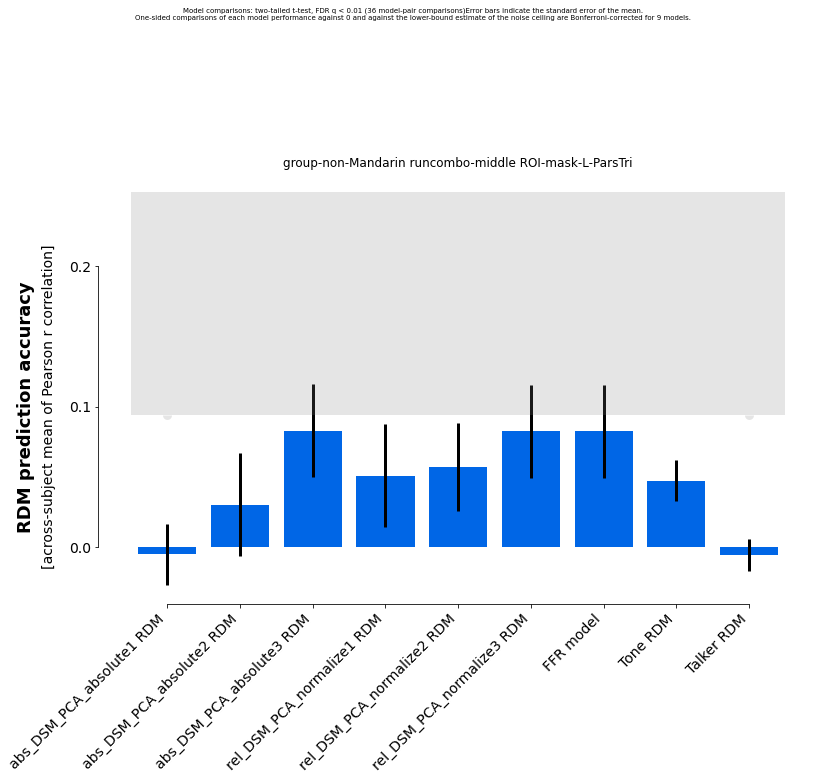

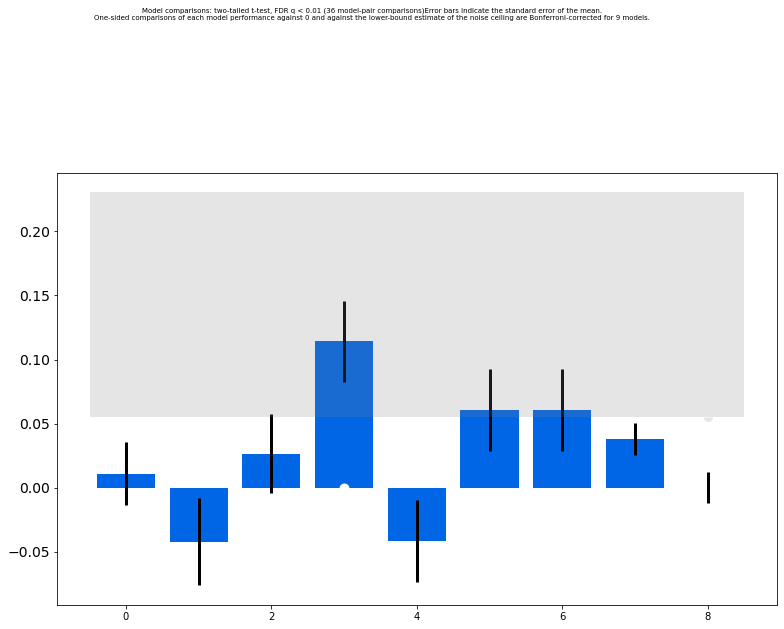

In [38]:
'''
group = 'Mandarin'
run = 'run00'
ROI = 'mask-R-ParsTri'
'''
for group in ['non-Mandarin']:#np.unique(group_rdms.rdm_descriptors['group']):
    #for run in np.unique(group_rdms.rdm_descriptors['run']):
    for ROI in np.unique(group_rdms.rdm_descriptors['ROI']):
        for runcombo in runcombo_dict:
            print(f'group-{group} runcombo-{runcombo} ROI-{ROI}')
            runs = runcombo_dict[runcombo]
            results_grr = rsatoolbox.inference.eval_fixed(all_models, 
                                                          group_rdms.subset('group', value=group).subset('run',value=runs).subset('ROI',value=ROI),  
                                                          method='corr',)
            fig, ax1, ax2 = rsatoolbox.vis.plot_model_comparison(results_grr);
            ax1.set_title(f'group-{group} runcombo-{runcombo} ROI-{ROI}');
            ax1.axes.set_xticklabels(ax1.xaxis.get_majorticklabels(), ha="right")

            #results_grr.save(f'results-eval/results-eval_group-{group}_run-{run}_ROI-{ROI}.hdf5',overwrite=True)

### Combine runs 1–3, 4–6

In [37]:
runcombo_dict = {'firsthalf': ['run00', 'run01', 'run02'], 'secondhalf': ['run03', 'run04','run05']}

In [38]:
runcombo_dict

{'firsthalf': ['run00', 'run01', 'run02'],
 'secondhalf': ['run03', 'run04', 'run05']}

In [39]:
for x in runcombo_dict:
    print(runcombo_dict[x])

['run00', 'run01', 'run02']
['run03', 'run04', 'run05']


group-Mandarin runs-firsthalf mask-L-HG
group-Mandarin runs-secondhalf mask-L-HG
group-Mandarin runs-firsthalf mask-L-IC
group-Mandarin runs-secondhalf mask-L-IC
group-Mandarin runs-firsthalf mask-L-PP
group-Mandarin runs-secondhalf mask-L-PP
group-Mandarin runs-firsthalf mask-L-PT
group-Mandarin runs-secondhalf mask-L-PT
group-Mandarin runs-firsthalf mask-L-ParsOp
group-Mandarin runs-secondhalf mask-L-ParsOp
group-Mandarin runs-firsthalf mask-L-ParsTri
group-Mandarin runs-secondhalf mask-L-ParsTri
group-Mandarin runs-firsthalf mask-L-STGa
group-Mandarin runs-secondhalf mask-L-STGa
group-Mandarin runs-firsthalf mask-L-STGp
group-Mandarin runs-secondhalf mask-L-STGp
group-Mandarin runs-firsthalf mask-R-HG
group-Mandarin runs-secondhalf mask-R-HG
group-Mandarin runs-firsthalf mask-R-IC
group-Mandarin runs-secondhalf mask-R-IC
group-Mandarin runs-firsthalf mask-R-PP
group-Mandarin runs-secondhalf mask-R-PP
group-Mandarin runs-firsthalf mask-R-PT
group-Mandarin runs-secondhalf mask-R-PT
gr

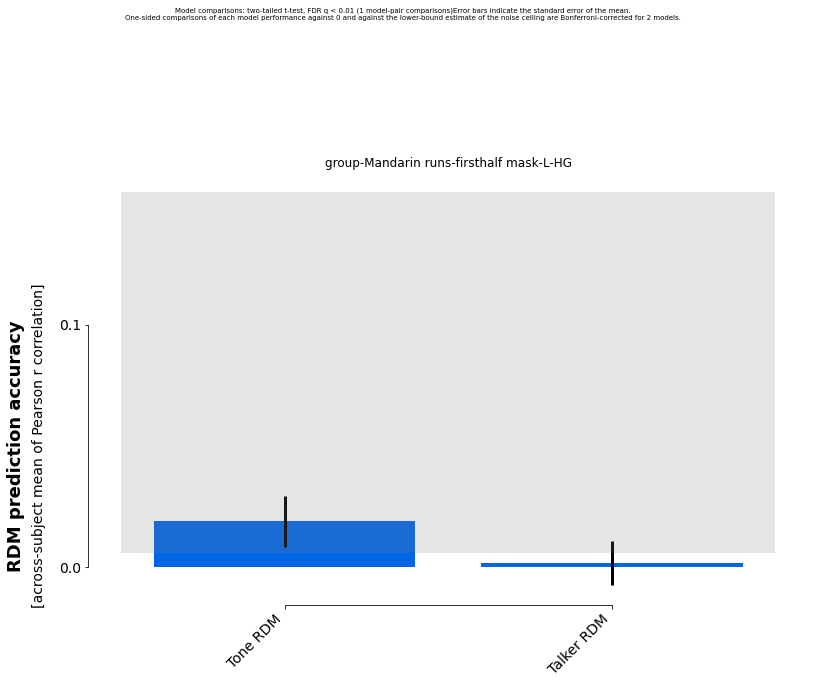

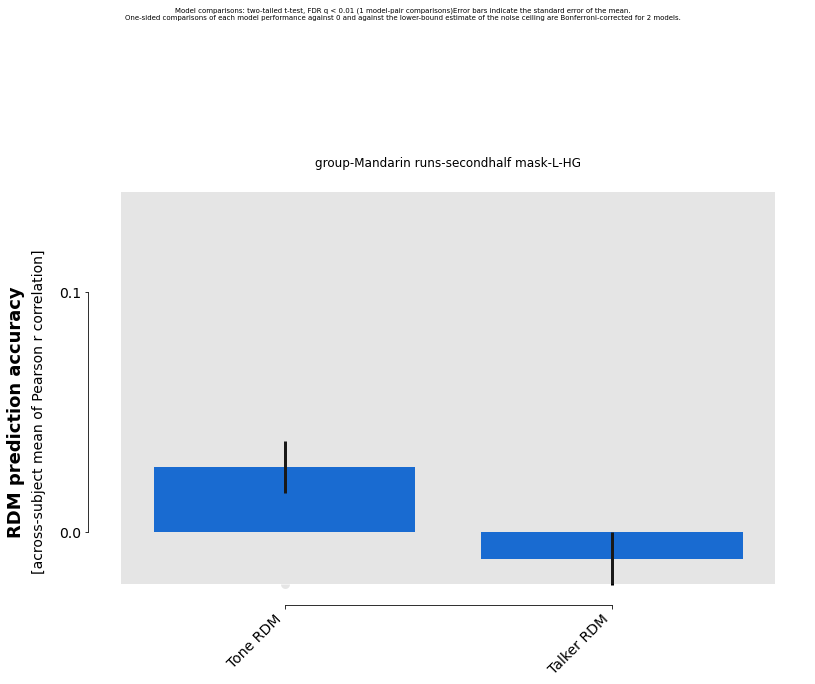

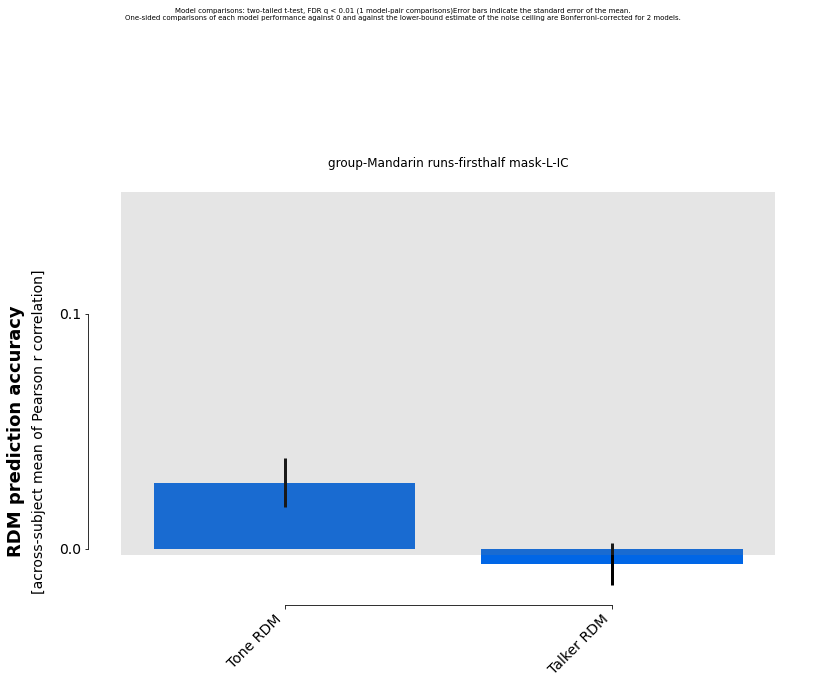

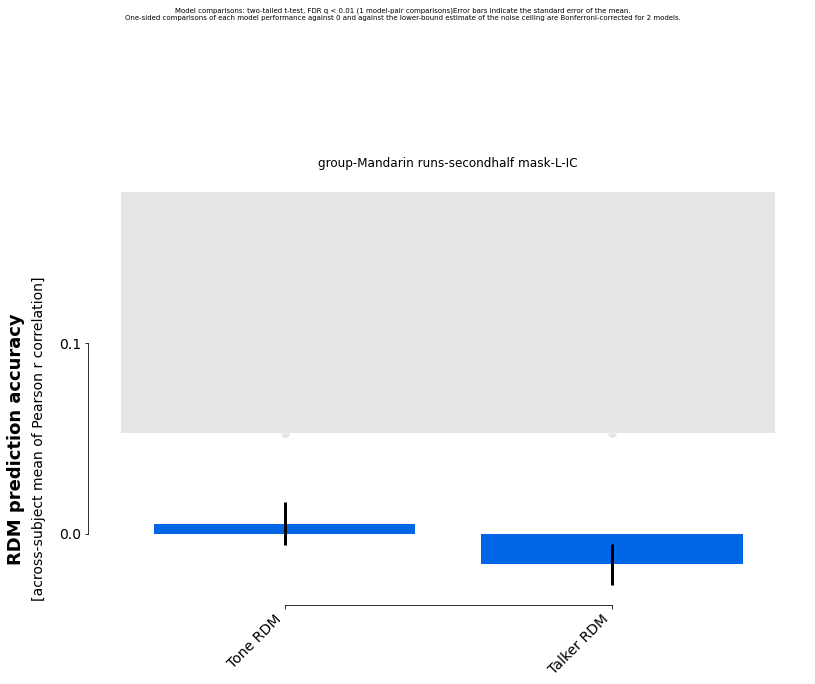

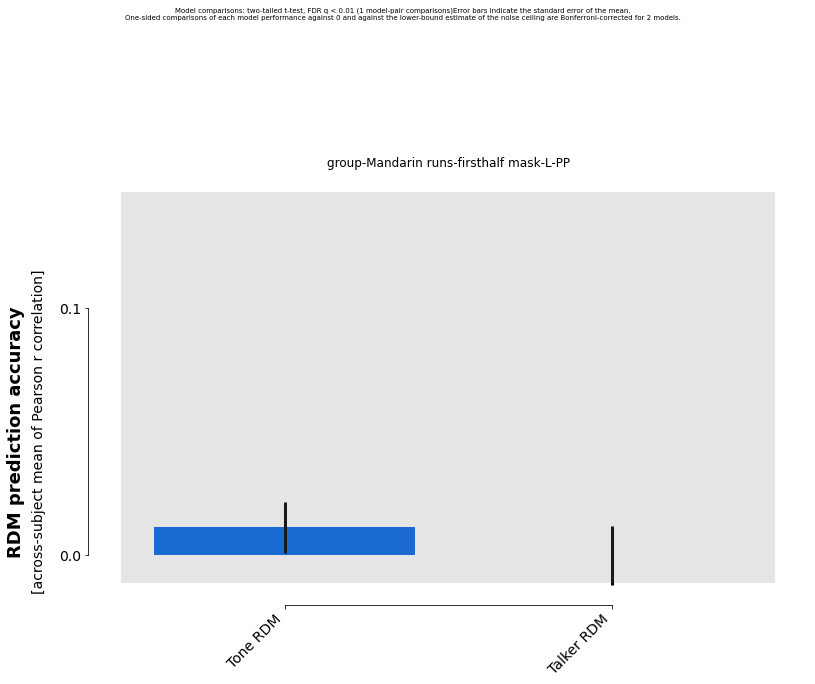

...

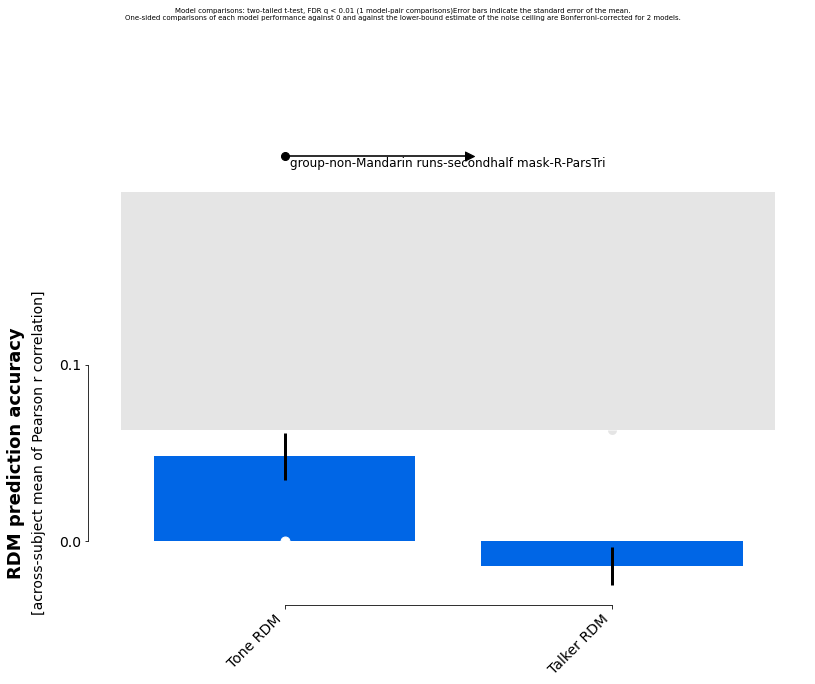

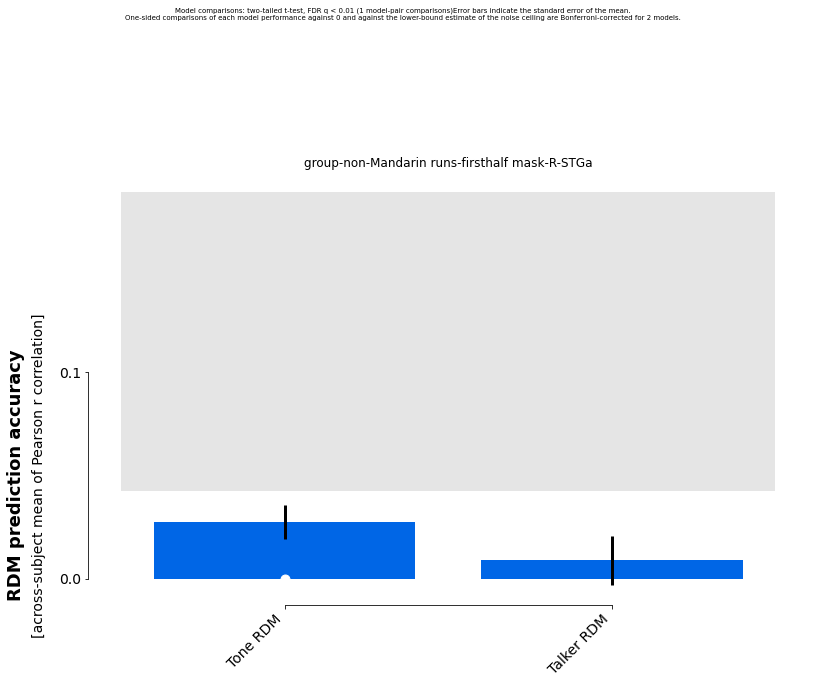

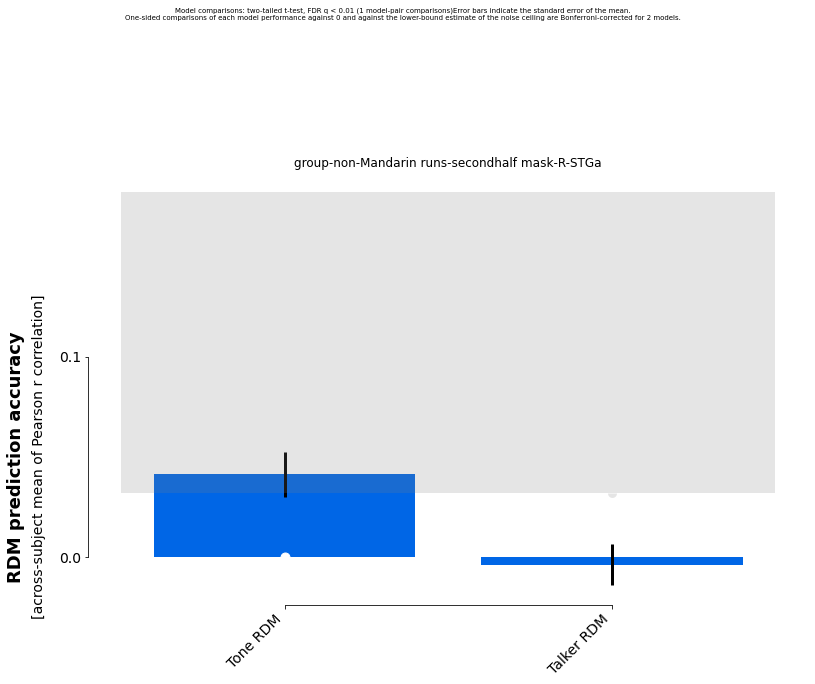

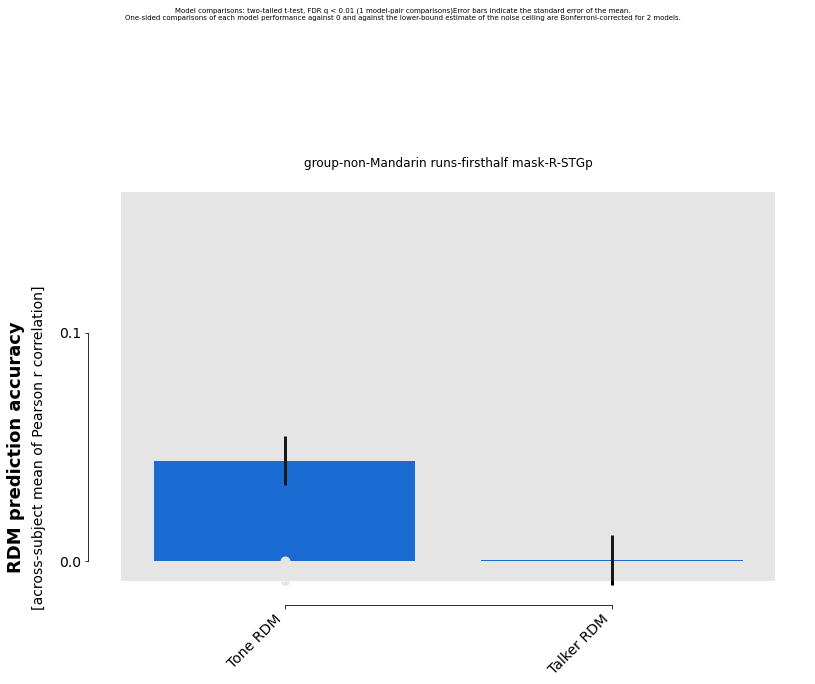

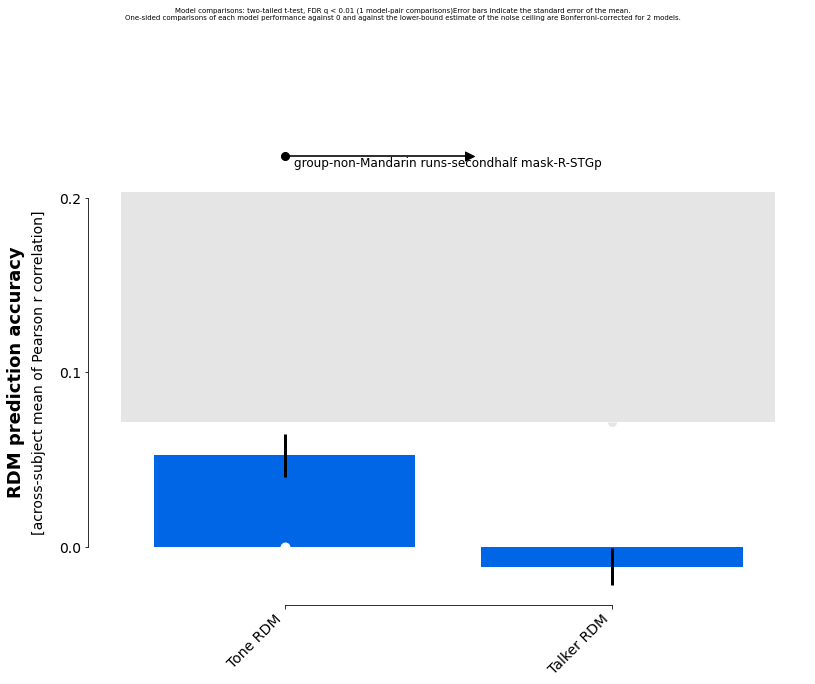

In [70]:
'''
group = 'Mandarin'
run = 'run00'
ROI = 'mask-R-ParsTri'
'''
for group in np.unique(group_rdms.rdm_descriptors['group']): #['non-Mandarin']:#
    #for run in np.unique(group_rdms.rdm_descriptors['run']):
    for ROI in np.unique(group_rdms.rdm_descriptors['ROI']):
        if 'MGN' in ROI:
            continue
        for runcombo in runcombo_dict:
            print(f'group-{group} runs-{runcombo} {ROI}')
            runs = runcombo_dict[runcombo]
            results_grr = rsatoolbox.inference.eval_fixed(
                                                          cat_models, #all_models, 
                                                          group_rdms.subset('group', value=group).subset('run',value=runs).subset('ROI',value=ROI),  
                                                          method='corr',)
            fig, ax1, ax2 = rsatoolbox.vis.plot_model_comparison(results_grr);
            ax1.set_title(f'group-{group} runs-{runcombo} {ROI}');
            ax1.axes.set_xticklabels(ax1.xaxis.get_majorticklabels(), ha="right")

            #results_grr.save(f'results-eval/results-eval_group-{group}_run-{run}_ROI-{ROI}.hdf5',overwrite=True)

### WIP: Hierarchical tests, split runs

In [39]:
mean_rdms_mand

rsatoolbox.rdm.RDMs(
dissimilarity_measure = 
None
dissimilarities = 
[[2.18434469 2.16593166 1.71754503 ... 1.64891619 2.0924978  1.91266717]
 [2.24480756 2.12806912 2.00712243 ... 2.41159459 2.52758356 2.16290508]
 [2.3028531  2.16342697 2.05838177 ... 2.16271216 2.17274798 2.16089866]
 ...
 [2.33004238 2.27638168 2.32752825 ... 2.00584334 2.37240804 2.01215973]
 [2.41159076 2.38467481 2.47870339 ... 2.16319079 2.40912419 2.06779915]
 [2.42380789 2.32801541 2.47918812 ... 2.1073666  2.41325774 2.00063277]]
descriptors = 
{}
rdm_descriptors = 
{'run': ['run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run00', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run01', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02', 'run02',

In [40]:
neural_models_dict = {}

neural_models_dict['Mandarin'] = [ModelFixed(x, rdm=mean_rdms_mand.subset('group', value='Mandarin').subset('ROI',value=x)) for x in np.unique(mean_rdms_mand.rdm_descriptors['ROI'])]
neural_models_dict['non-Mandarin'] = [ModelFixed(x, rdm=mean_rdms_nman.subset('group', value='non-Mandarin').subset('ROI',value=x)) for x in np.unique(mean_rdms_nman.rdm_descriptors['ROI'])]


In [43]:
for group in ['non-Mandarin']:# np.unique(group_rdms.rdm_descriptors['group']): # 
    for ROI in np.unique(group_rdms.rdm_descriptors['ROI']):
        print(f'group-{group} ROI-{ROI}')
        results_grr = rsatoolbox.inference.eval_fixed(neural_models_dict[group], 
                                                      group_rdms.subset('group', value=group).subset('ROI',value=ROI),  
                                                      method='corr',)
        fig, ax1, ax2 = rsatoolbox.vis.plot_model_comparison(results_grr,
                                                             test_pair_comparisons='nili', #False, # getting a bug from plot_arrow()
                                                            );
        ax1.set_title(f'group-{group} ROI-{ROI}');
        ax1.axes.set_xticklabels(ax1.xaxis.get_majorticklabels(), ha="right")

group-Mandarin ROI-mask-L-HG


ValueError: could not broadcast input array from shape (6,84) into shape (84,)

### Per-participant

group-Mandarin ROI-mask-L-STGp sub-FLT03
group-Mandarin ROI-mask-R-STGp sub-FLT03
group-Mandarin ROI-mask-L-STGp sub-FLT05
group-Mandarin ROI-mask-R-STGp sub-FLT05
group-Mandarin ROI-mask-L-STGp sub-FLT07
group-Mandarin ROI-mask-R-STGp sub-FLT07
group-Mandarin ROI-mask-L-STGp sub-FLT08
group-Mandarin ROI-mask-R-STGp sub-FLT08
group-Mandarin ROI-mask-L-STGp sub-FLT10
group-Mandarin ROI-mask-R-STGp sub-FLT10
group-Mandarin ROI-mask-L-STGp sub-FLT15
group-Mandarin ROI-mask-R-STGp sub-FLT15
group-Mandarin ROI-mask-L-STGp sub-FLT17
group-Mandarin ROI-mask-R-STGp sub-FLT17
group-Mandarin ROI-mask-L-STGp sub-FLT18
group-Mandarin ROI-mask-R-STGp sub-FLT18
group-Mandarin ROI-mask-L-STGp sub-FLT19
group-Mandarin ROI-mask-R-STGp sub-FLT19
group-Mandarin ROI-mask-L-STGp sub-FLT21
group-Mandarin ROI-mask-R-STGp sub-FLT21
group-Mandarin ROI-mask-L-STGp sub-FLT22
group-Mandarin ROI-mask-R-STGp sub-FLT22
group-Mandarin ROI-mask-L-STGp sub-FLT23
group-Mandarin ROI-mask-R-STGp sub-FLT23
group-Mandarin R

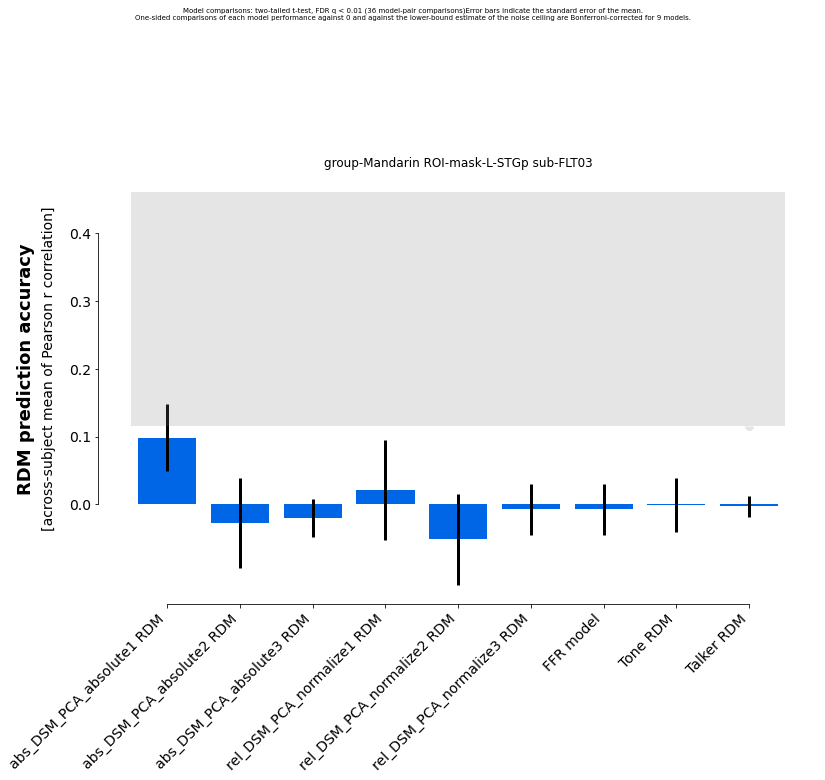

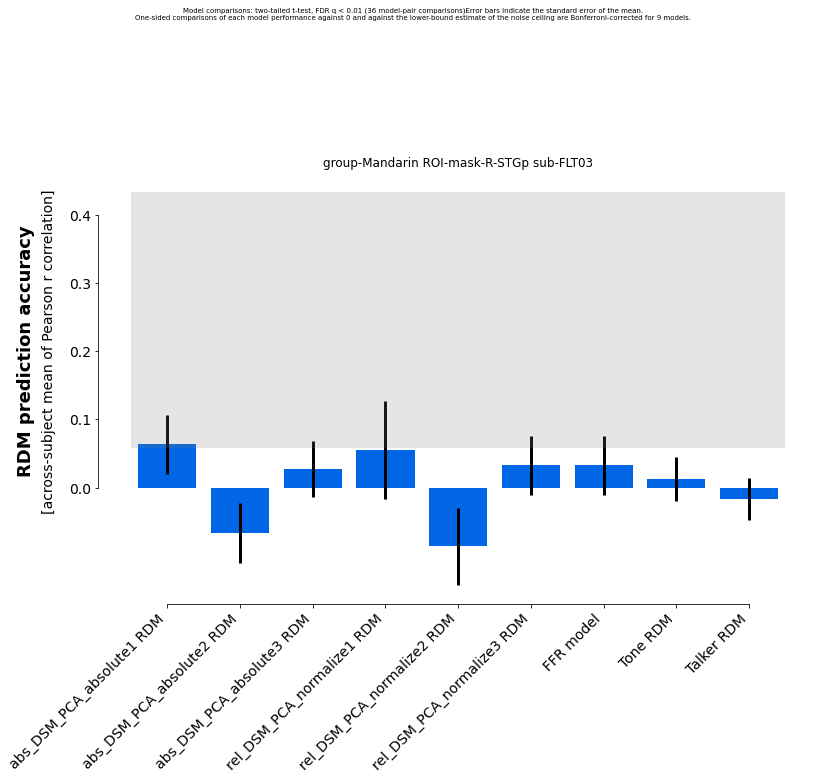

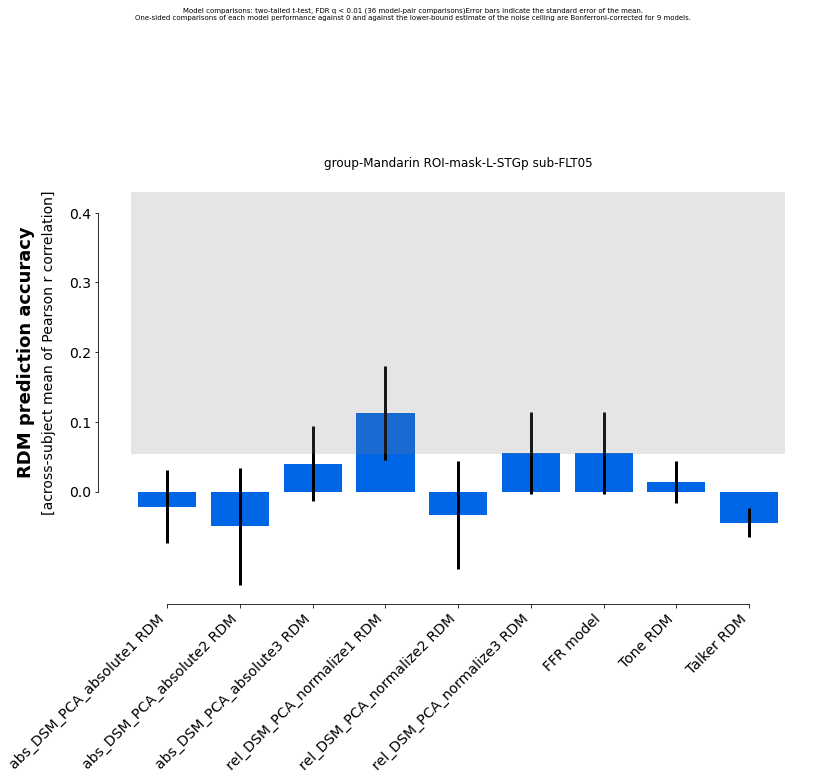

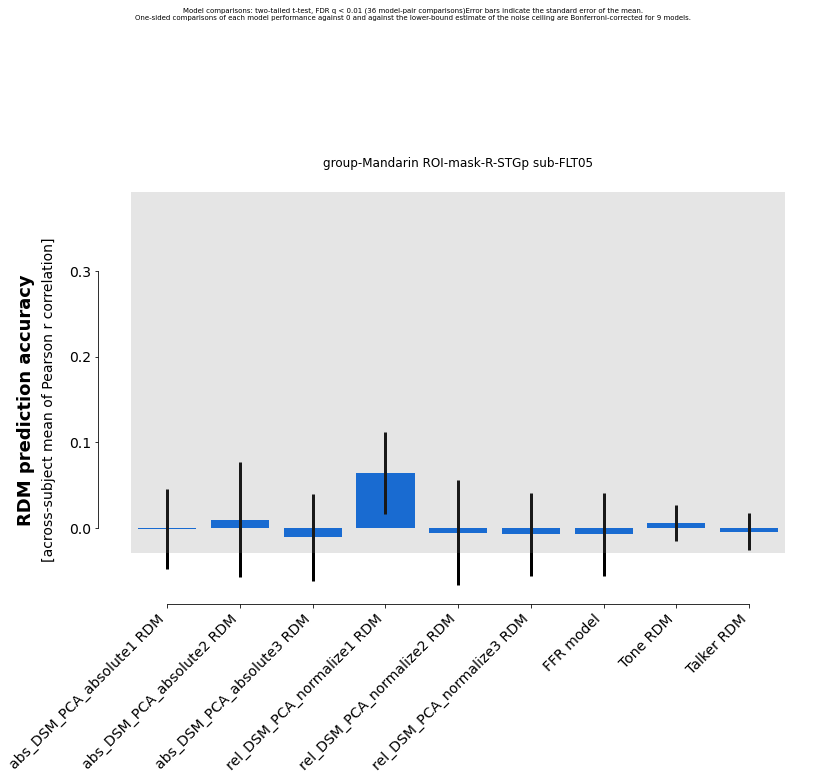

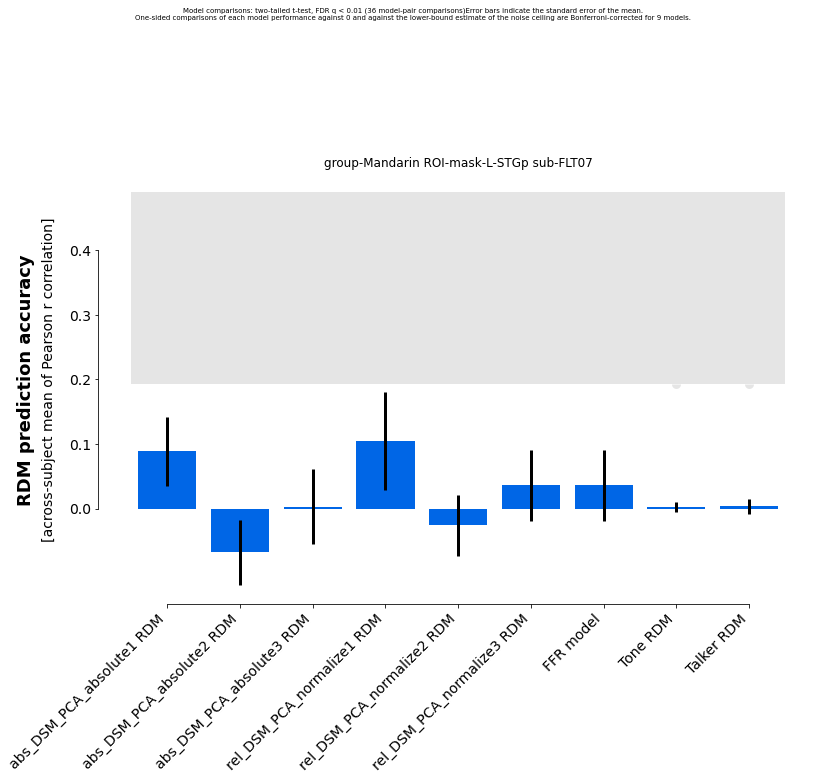

...

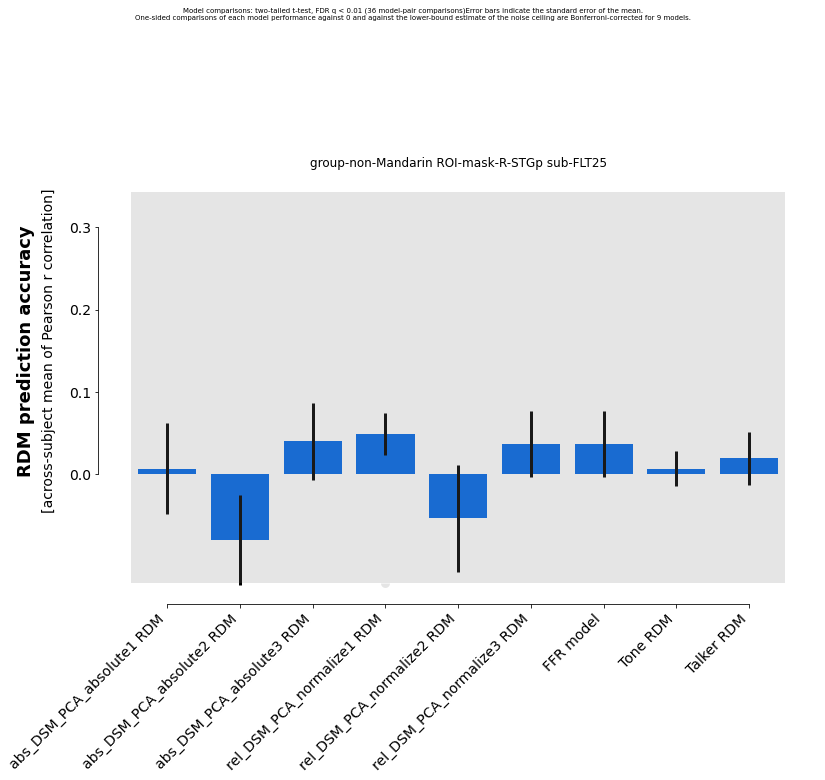

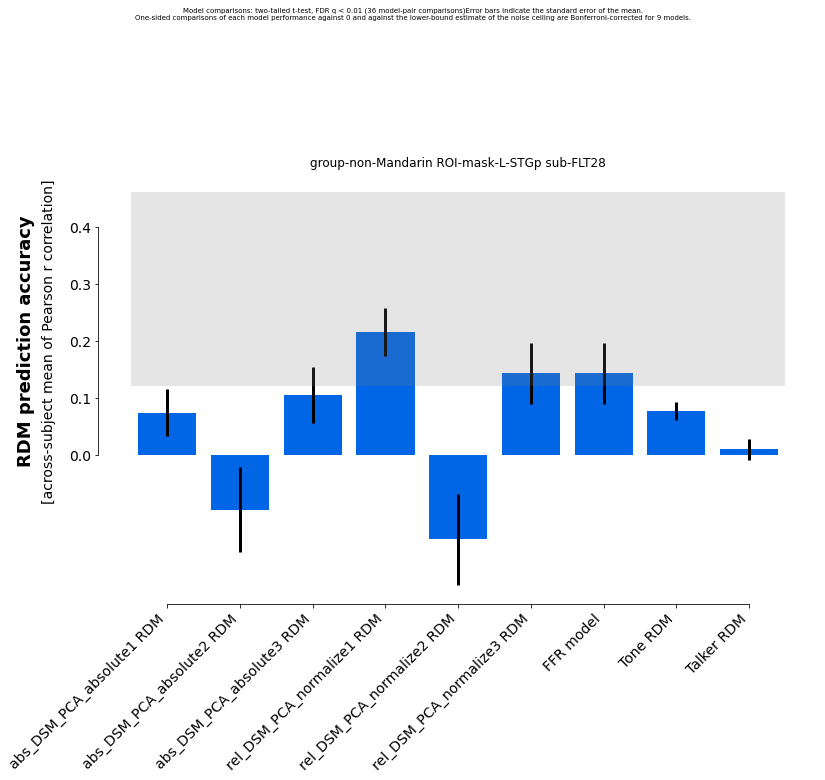

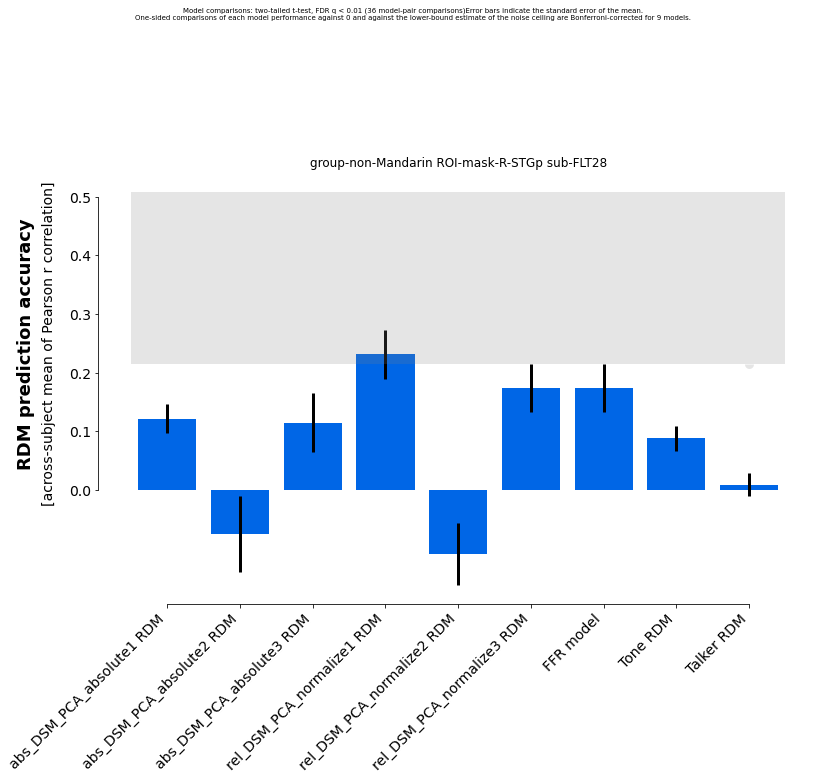

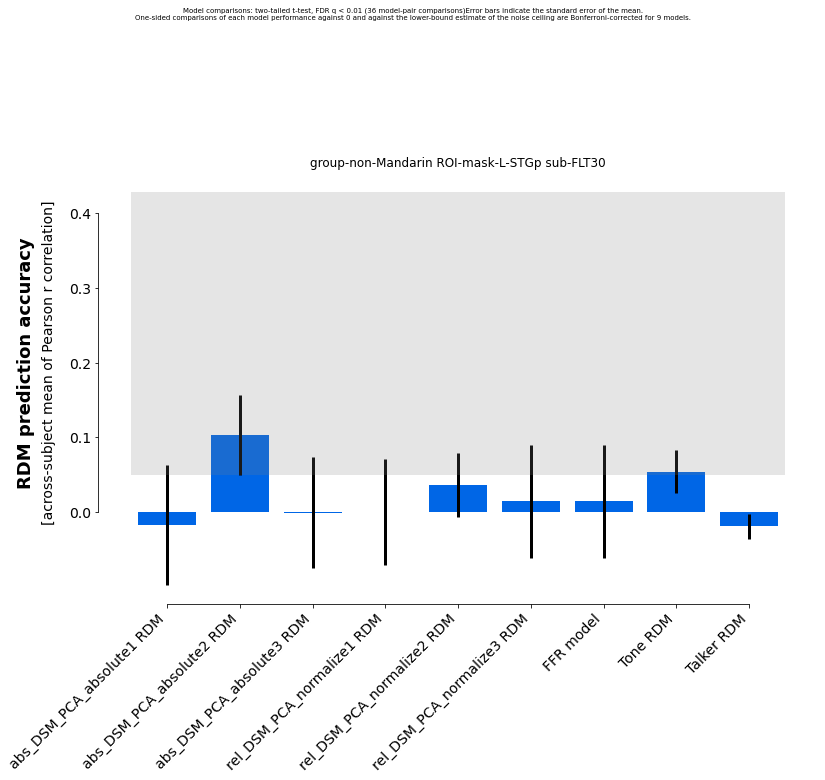

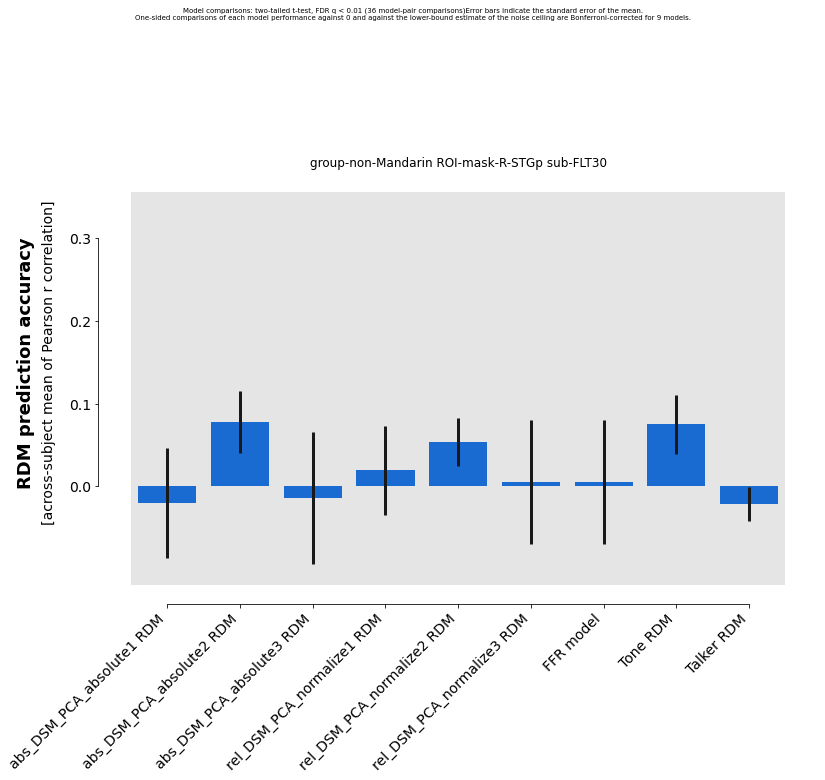

In [68]:
'''
ROI = 'mask-R-ParsTri'
'''

for group in sub_group_dict:
    for sub_id_long in sub_group_dict[group]:
        sub_id = sub_id_long[4:]
        for ROI in np.unique(group_rdms.rdm_descriptors['ROI']):
            if ROI == 'mask-L-MGN':
                continue
            if 'STGp' in ROI:
                print(f'group-{group} ROI-{ROI} sub-{sub_id}')
                results_grr = rsatoolbox.inference.eval_fixed(all_models, 
                                                              group_rdms.subset('ROI',value=ROI).subset('participant', value=sub_id),  
                                                              method='corr',)
                fig, ax1, ax2 = rsatoolbox.vis.plot_model_comparison(results_grr);
                ax1.set_title(f'group-{group} ROI-{ROI} sub-{sub_id}');
                ax1.axes.set_xticklabels(ax1.xaxis.get_majorticklabels(), ha="right")


## Run-all RSA

### generate run-all RDMs

In [32]:
group_rdm_list = []
for sx, sub_id in enumerate(participant_list):
    print(sub_id)
    group_id = group_assignment[sx]

    # set this path to wherever you saved the folder containing the img-files
    data_folder = os.path.join(model_dir, 'masked_statmaps',
                               'sub-{}'.format(sub_id),
                               'statmaps_masked',
                               'run-all_LSS')

    all_im_paths = sorted(glob('{}/*mask-*_cond-*_map-{}.csv'.format(data_folder, statmap)))
    #mask_list = np.unique([os.path.basename(x).split('_')[2] for x in all_im_paths])

    all_mask_data = []
    for mx, mask_descrip in enumerate(mask_list):

        print(mask_descrip)
        image_paths = sorted(glob('{}/*{}*/*{}*_cond-*_map-{}.csv'.format(data_folder, mask_descrip, mask_descrip, statmap)))
        #print('# of images: ', len(image_paths))

        mask_fpath = os.path.join(deriv_dir, 'nilearn', 'masks', 'sub-{}'.format(sub_id),
                                  'space-{}'.format(space_label), 'masks-dseg',
                                  'sub-{}_space-{}_mask-gm.nii.gz'.format(sub_id, space_label))

        try:
            n_vox = np.genfromtxt(image_paths[0]).shape[0]
        except IndexError:
            n_vox = 1

        data = np.zeros((len(image_paths), n_vox))
        for x, im in enumerate(image_paths):
            data[x] = np.genfromtxt(im)
        all_mask_data.append(data)

        roi_rdms = []
    for rx, mask_data in enumerate(all_mask_data):
        dataset = rsatoolbox.data.Dataset(mask_data, 
                                          descriptors={'participant': sub_id, 
                                                       'ROI': mask_list[rx], 
                                                       'group': group_id
                                                      },)
        test_rdm = rsatoolbox.rdm.calc_rdm(dataset)
        roi_rdms.append(test_rdm)
        group_rdm_list.append(test_rdm)

    concat_rdms = rsatoolbox.rdm.rdms.concat(roi_rdms)
runall_rdms = rsatoolbox.rdm.rdms.concat(group_rdm_list)
runall_rdms.save('group_run-all_LSS_rdms.hdf5')

FLT02
mask-L-IC
mask-L-MGN
mask-L-HG
mask-L-PP
mask-L-PT
mask-L-STGp
mask-L-STGa
mask-L-ParsOp
mask-L-ParsTri
mask-R-IC
mask-R-MGN
mask-R-HG
mask-R-PP
mask-R-PT
mask-R-STGp
mask-R-STGa
mask-R-ParsOp
mask-R-ParsTri
FLT03
mask-L-IC
mask-L-MGN
mask-L-HG
mask-L-PP
mask-L-PT
mask-L-STGp
mask-L-STGa
mask-L-ParsOp
mask-L-ParsTri
mask-R-IC
mask-R-MGN
mask-R-HG
mask-R-PP
mask-R-PT
mask-R-STGp
mask-R-STGa
mask-R-ParsOp
mask-R-ParsTri
FLT04
mask-L-IC
mask-L-MGN
mask-L-HG
mask-L-PP
mask-L-PT
mask-L-STGp
mask-L-STGa
mask-L-ParsOp
mask-L-ParsTri
mask-R-IC
mask-R-MGN
mask-R-HG
mask-R-PP
mask-R-PT
mask-R-STGp
mask-R-STGa
mask-R-ParsOp
mask-R-ParsTri
FLT05
mask-L-IC
mask-L-MGN
mask-L-HG
mask-L-PP
mask-L-PT
mask-L-STGp
mask-L-STGa
mask-L-ParsOp
mask-L-ParsTri
mask-R-IC
mask-R-MGN
mask-R-HG
mask-R-PP
mask-R-PT
mask-R-STGp
mask-R-STGa
mask-R-ParsOp
mask-R-ParsTri
FLT06
mask-L-IC
mask-L-MGN
mask-L-HG
mask-L-PP
mask-L-PT
mask-L-STGp
mask-L-STGa
mask-L-ParsOp
mask-L-ParsTri
mask-R-IC
mask-R-MGN
mask-R-HG
mas

In [33]:
roi_rdms

[rsatoolbox.rdm.RDMs(
 dissimilarity_measure = 
 squared euclidean
 dissimilarities = 
 [[1.29113374 1.5508553  1.82069912 3.21362722 2.20113968 2.1652772
   5.50604987 4.19084559 2.29127918 2.90315667 3.02901287 5.44797265
   1.96758667 1.88401113 3.25830168 0.57954289 1.70058645 2.7384719
   1.56645473 1.39147055 2.70869771 2.23046474 1.52140755 1.6146341
   2.14569135 4.29511092 2.26800995 1.0947733  2.25712437 1.59133851
   3.85865022 1.46403005 1.50384195 2.99130107 1.98028621 1.69749417
   1.06515312 1.20509004 3.59330483 2.60598458 1.40418661 1.51198447
   3.71187424 1.81430941 2.87744347 3.71505005 1.96110603 1.32002531
   2.12113787 3.09506375 2.2578037  3.21541228 0.92084456 1.93037744
   2.41497761 2.33907746 4.36528066 3.97056685 2.31823299 4.50121614
   4.77214836 4.269341   3.39951353 3.23650771 4.1235658  1.16127947
   3.10137196 1.75913482 1.16258447 1.39528511 2.45045727 2.1934305
   2.34105215 1.57593142 1.87528936 3.25887335 2.12395718 1.33177176
   1.78290433 1.7779

In [34]:
runall_rdms.pattern_descriptors = pattern_descriptors

In [35]:
runall_rdms

rsatoolbox.rdm.RDMs(
dissimilarity_measure = 
None
dissimilarities = 
[[1.40924999 2.66325461 1.84505286 ... 1.7088736  1.33167823 0.8592301 ]
 [2.21237098 2.14950354 1.62948563 ... 1.4023714  1.91698068 1.93859945]
 [2.32618513 2.63939258 2.42970105 ... 1.59993947 1.63449709 1.56709288]
 ...
 [1.98361573 1.7192756  2.00921907 ... 1.97944517 2.19677555 2.31836048]
 [1.88566946 1.94517668 2.27990385 ... 1.90193625 2.50595614 2.71935543]
 [1.70656198 1.86069334 2.2127061  ... 1.80834721 2.68662181 3.0224045 ]]
descriptors = 
{}
rdm_descriptors = 
{'participant': ['FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT02', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT03', 'FLT04', 'FLT04', 'FLT04', 'FLT04', 'FLT04', 'FLT04', 'FLT04', 'FLT04', 'FLT04', 'FLT04', 'FLT04', 'FLT04', 

### load pre-generated run-all RDMs

In [33]:
runall_rdms = rsatoolbox.rdm.rdms.load_rdm('group_run-all_LSS_rdms.hdf5')

### plot all RDMs

In [ ]:
fig = plt.figure(constrained_layout=True, figsize=(20,30), dpi=500)
fig.suptitle('Single-participant ROI RDMs')

subfigs = fig.subfigures(nrows=len(participant_list), ncols=1)

for sx, sub_id in enumerate(participant_list):
    subfigs[sx].suptitle(f'{sub_id} - {group_assignment[sx]} group')
    axes = subfigs[sx].subplots(nrows=1, ncols=len(mask_list))
    for rx, roi in enumerate(mask_list):
        rsatoolbox.vis.show_rdm_panel(runall_rdms.subset('participant', value=sub_id).subset('ROI', value=roi), 
                                        ax=axes[rx],
                                        rdm_descriptor='ROI', 
                                        cmap='inferno',
                                        #show_colorbar='panel', # cut figsize height in half if showing colorbar
                                       );


### Mean RDMs across participants per group

In [34]:
mean_rdms_mand_list = []
mean_rdms_nman_list = []
for rx, roi in enumerate(mask_list):
    # Mandarin-speaking
    dissim_mand = runall_rdms.subset('group', value='Mandarin').subset('ROI', value=roi).dissimilarities
    
    roi_mand = RDMs(dissim_mand.mean(axis=0),
                    rdm_descriptors={'ROI': mask_list[rx], 'group': 'Mandarin'},
                    pattern_descriptors=pattern_descriptors)
    mean_rdms_mand_list.append(roi_mand)
    
    # non-Mandarin-speaking
    dissim_nman = runall_rdms.subset('group', value='non-Mandarin').subset('ROI', value=roi).dissimilarities
    roi_nman = RDMs(dissim_nman.mean(axis=0),
                    rdm_descriptors={'ROI': mask_list[rx], 'group': 'non-Mandarin'},
                    pattern_descriptors=pattern_descriptors)
    mean_rdms_nman_list.append(roi_nman)

mean_rdms_mand = rsatoolbox.rdm.rdms.concat(mean_rdms_mand_list)
mean_rdms_nman = rsatoolbox.rdm.rdms.concat(mean_rdms_nman_list)



In [35]:
mean_rdms_nman

rsatoolbox.rdm.RDMs(
dissimilarity_measure = 
None
dissimilarities = 
[[2.38902109 2.63207205 2.34004519 ... 2.73256195 2.24161509 2.77280507]
 [2.40617473 2.10557781 2.17536334 ... 2.1792102  1.86388909 2.13165379]
 [2.22606838 2.31354881 2.39014602 ... 2.19775741 2.22173574 2.26882122]
 ...
 [2.02288878 2.18723457 2.15537475 ... 2.06074714 2.11972084 2.10085046]
 [2.03048418 2.19110332 2.20170728 ... 2.08244188 2.11514586 2.3192096 ]
 [1.97471774 2.03945699 2.18875005 ... 2.1347646  2.08425169 2.15577791]]
descriptors = 
{}
rdm_descriptors = 
{'ROI': ['mask-L-IC', 'mask-L-MGN', 'mask-L-HG', 'mask-L-PP', 'mask-L-PT', 'mask-L-STGp', 'mask-L-STGa', 'mask-L-ParsOp', 'mask-L-ParsTri', 'mask-R-IC', 'mask-R-MGN', 'mask-R-HG', 'mask-R-PP', 'mask-R-PT', 'mask-R-STGp', 'mask-R-STGa', 'mask-R-ParsOp', 'mask-R-ParsTri'], 'group': ['non-Mandarin', 'non-Mandarin', 'non-Mandarin', 'non-Mandarin', 'non-Mandarin', 'non-Mandarin', 'non-Mandarin', 'non-Mandarin', 'non-Mandarin', 'non-Mandarin', 'non-Ma

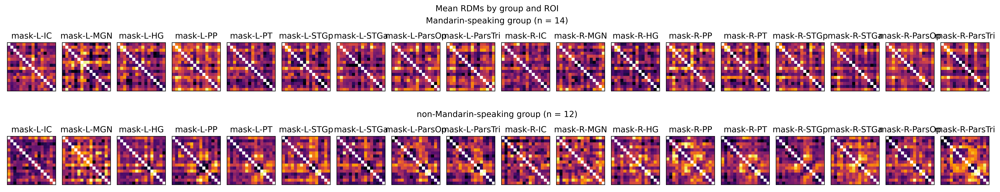

In [36]:
fig = plt.figure(constrained_layout=True, figsize=(20,4), dpi=500)
fig.suptitle('Mean RDMs by group and ROI')

subfigs = fig.subfigures(nrows=2, ncols=1)

n_mand = len(sub_group_dict['Mandarin'])
n_nman = len(sub_group_dict['non-Mandarin'])

subfigs[0].suptitle(f'Mandarin-speaking group (n = {n_mand})')
subfigs[1].suptitle(f'non-Mandarin-speaking group (n = {n_nman})')

axs0 = subfigs[0].subplots(nrows=1, ncols=len(mask_list))
axs1 = subfigs[1].subplots(nrows=1, ncols=len(mask_list))
for rx, roi in enumerate(mask_list):
    rsatoolbox.vis.show_rdm_panel(mean_rdms_mand.subset('ROI', value=roi), 
                                  rdm_descriptor='ROI', 
                                  cmap='inferno', 
                                  ax=axs0[rx])
    rsatoolbox.vis.show_rdm_panel(mean_rdms_nman.subset('ROI', value=roi), 
                                  rdm_descriptor='ROI', 
                                  cmap='inferno', 
                                  ax=axs1[rx])

#### MDS

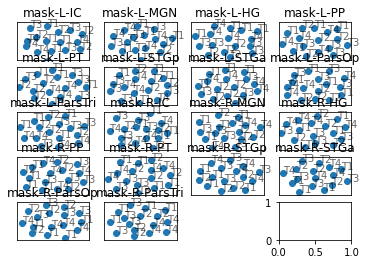

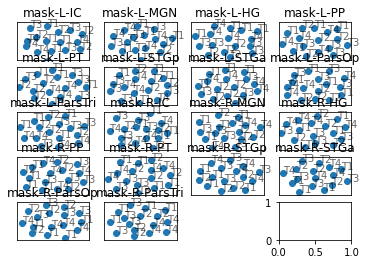

In [58]:
rsatoolbox.vis.scatter_plot.show_MDS(mean_rdms_mand, 
                                     rdm_descriptor='ROI',
                                     pattern_descriptor='tone')

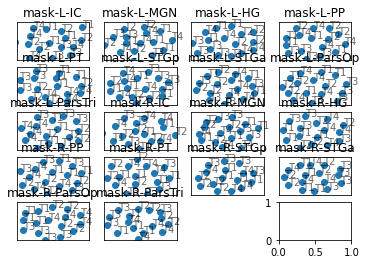

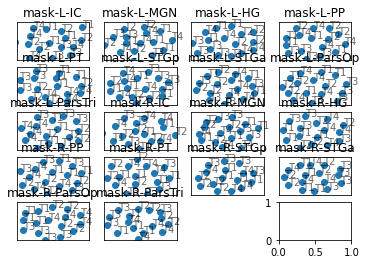

In [59]:
rsatoolbox.vis.scatter_plot.show_MDS(mean_rdms_nman, 
                                     rdm_descriptor='ROI',
                                     pattern_descriptor='tone')

### Model comparisons

In [48]:
[x.name for x in all_models]

['abs_DSM_PCA_absolute1 RDM',
 'abs_DSM_PCA_absolute2 RDM',
 'abs_DSM_PCA_absolute3 RDM',
 'rel_DSM_PCA_normalize1 RDM',
 'rel_DSM_PCA_normalize2 RDM',
 'rel_DSM_PCA_normalize3 RDM',
 'FFR model',
 'Tone RDM',
 'Talker RDM']

group-Mandarin ROI-mask-L-HG
group-Mandarin ROI-mask-L-IC
group-Mandarin ROI-mask-L-MGN
group-Mandarin ROI-mask-L-PP
group-Mandarin ROI-mask-L-PT
group-Mandarin ROI-mask-L-ParsOp
group-Mandarin ROI-mask-L-ParsTri
group-Mandarin ROI-mask-L-STGa
group-Mandarin ROI-mask-L-STGp
group-Mandarin ROI-mask-R-HG
group-Mandarin ROI-mask-R-IC
group-Mandarin ROI-mask-R-MGN
group-Mandarin ROI-mask-R-PP
group-Mandarin ROI-mask-R-PT
group-Mandarin ROI-mask-R-ParsOp
group-Mandarin ROI-mask-R-ParsTri
group-Mandarin ROI-mask-R-STGa
group-Mandarin ROI-mask-R-STGp
group-non-Mandarin ROI-mask-L-HG
group-non-Mandarin ROI-mask-L-IC
group-non-Mandarin ROI-mask-L-MGN
group-non-Mandarin ROI-mask-L-PP
group-non-Mandarin ROI-mask-L-PT
group-non-Mandarin ROI-mask-L-ParsOp


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/rsatoolbox/vis/model_plot.py:282: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12.5, 10))


group-non-Mandarin ROI-mask-L-ParsTri
group-non-Mandarin ROI-mask-L-STGa
group-non-Mandarin ROI-mask-L-STGp
group-non-Mandarin ROI-mask-R-HG
group-non-Mandarin ROI-mask-R-IC
group-non-Mandarin ROI-mask-R-MGN
group-non-Mandarin ROI-mask-R-PP
group-non-Mandarin ROI-mask-R-PT
group-non-Mandarin ROI-mask-R-ParsOp
group-non-Mandarin ROI-mask-R-ParsTri
group-non-Mandarin ROI-mask-R-STGa
group-non-Mandarin ROI-mask-R-STGp


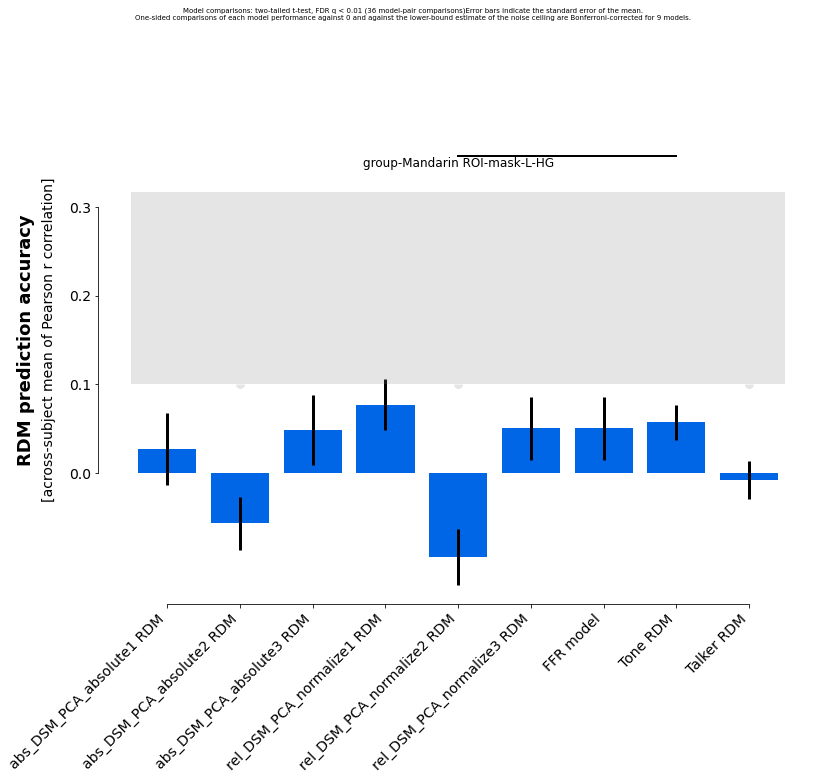

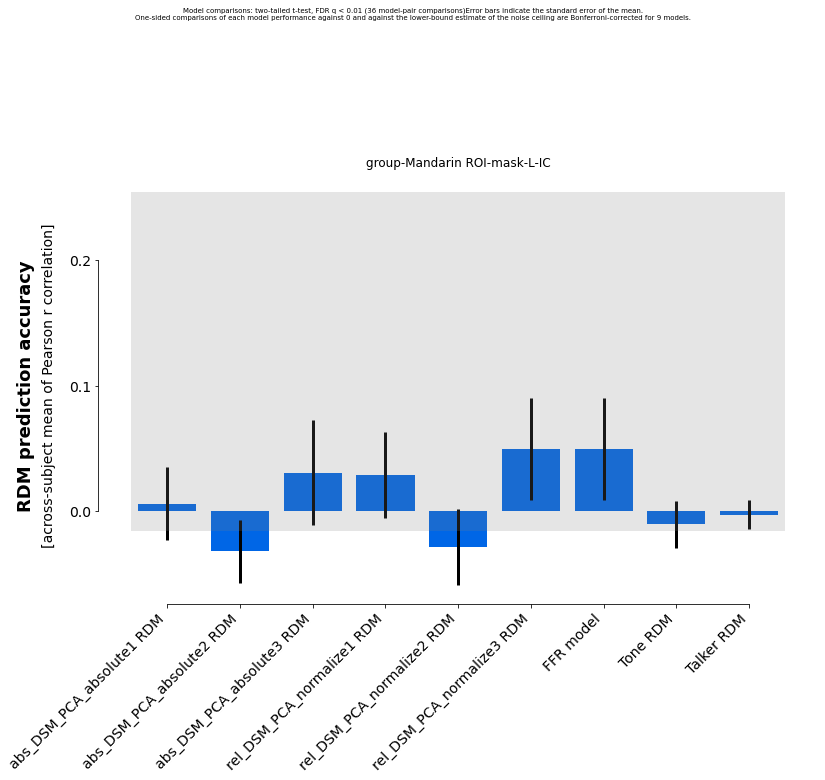

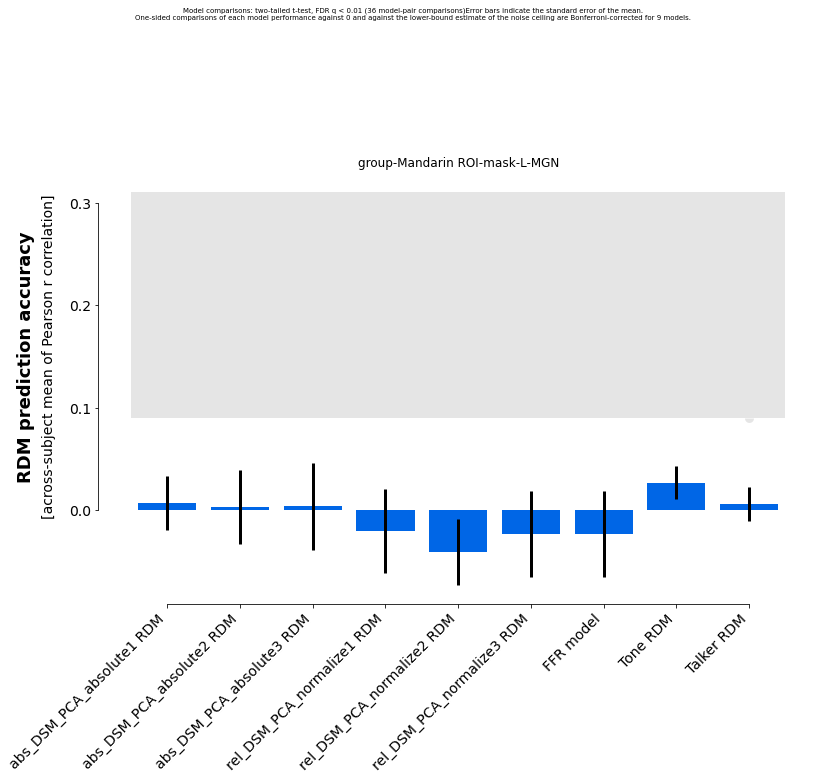

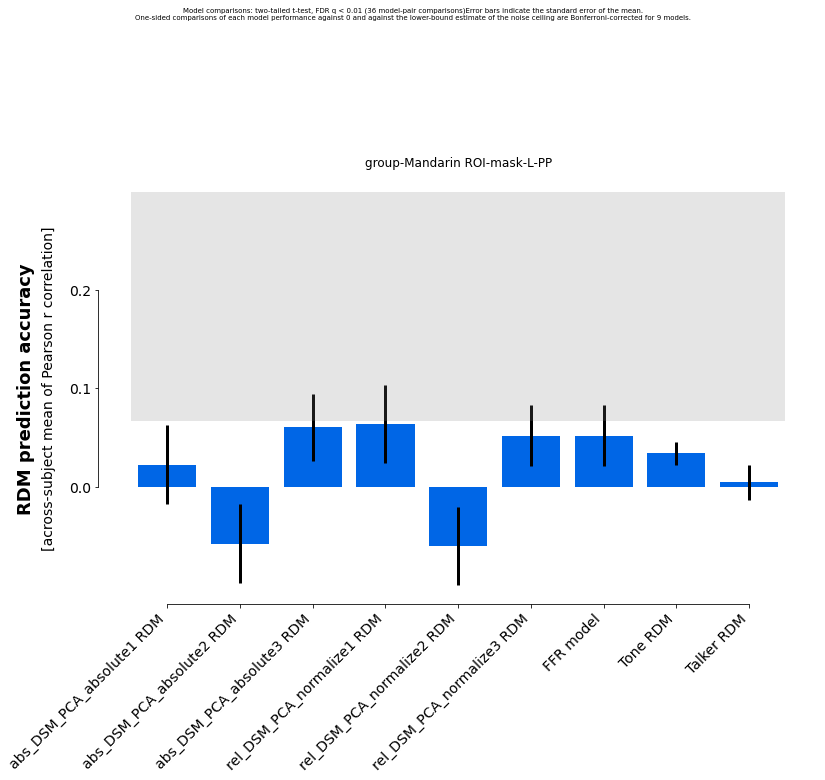

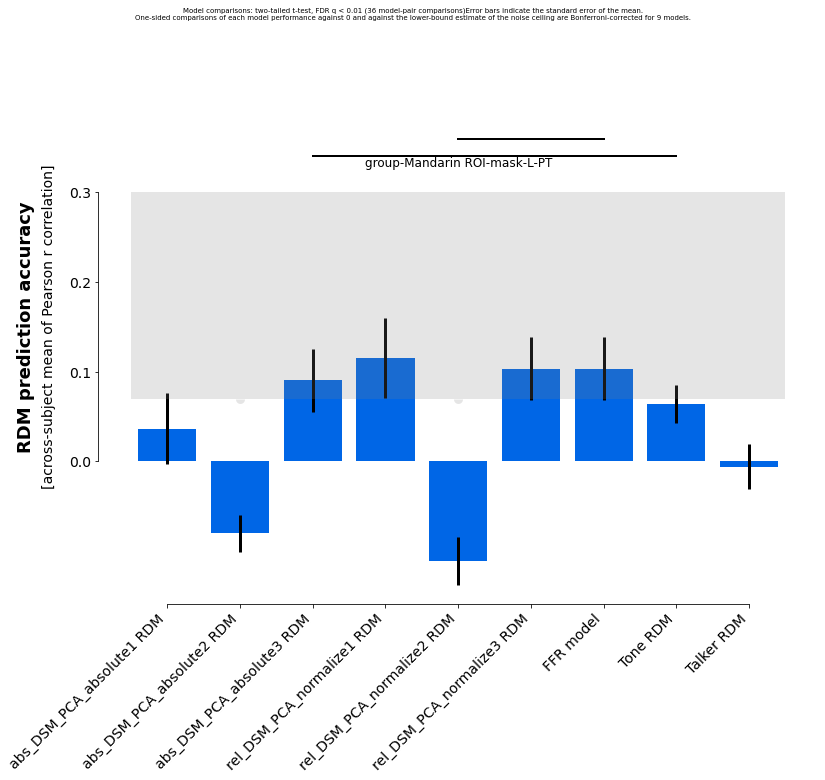

...

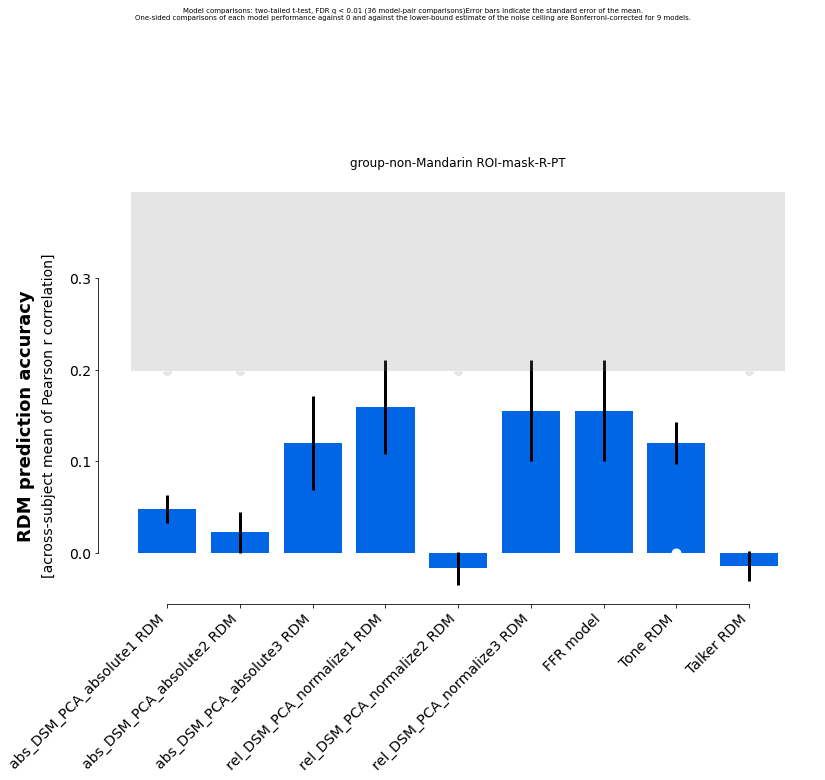

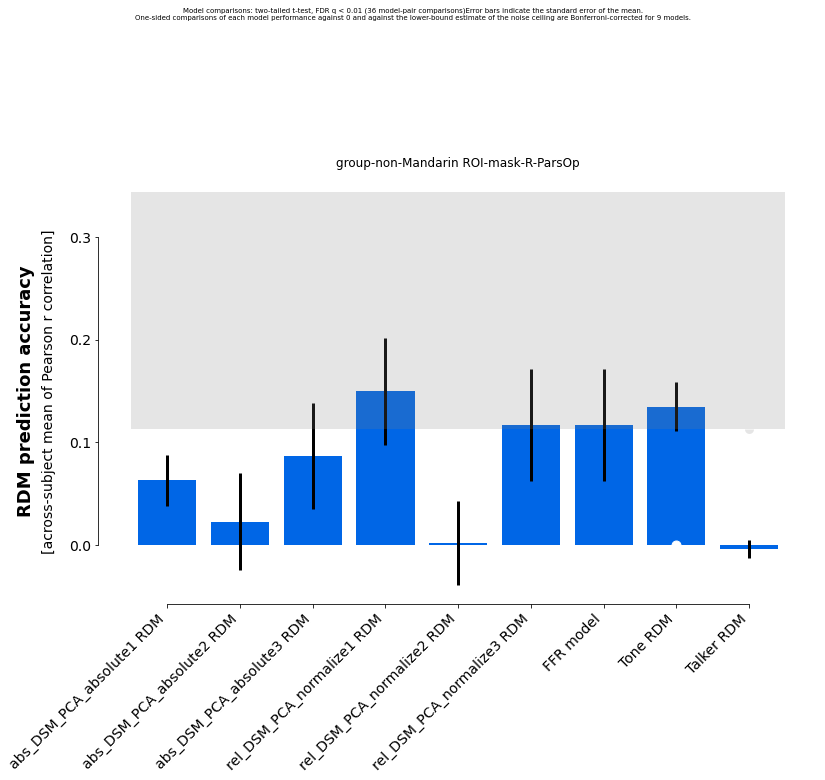

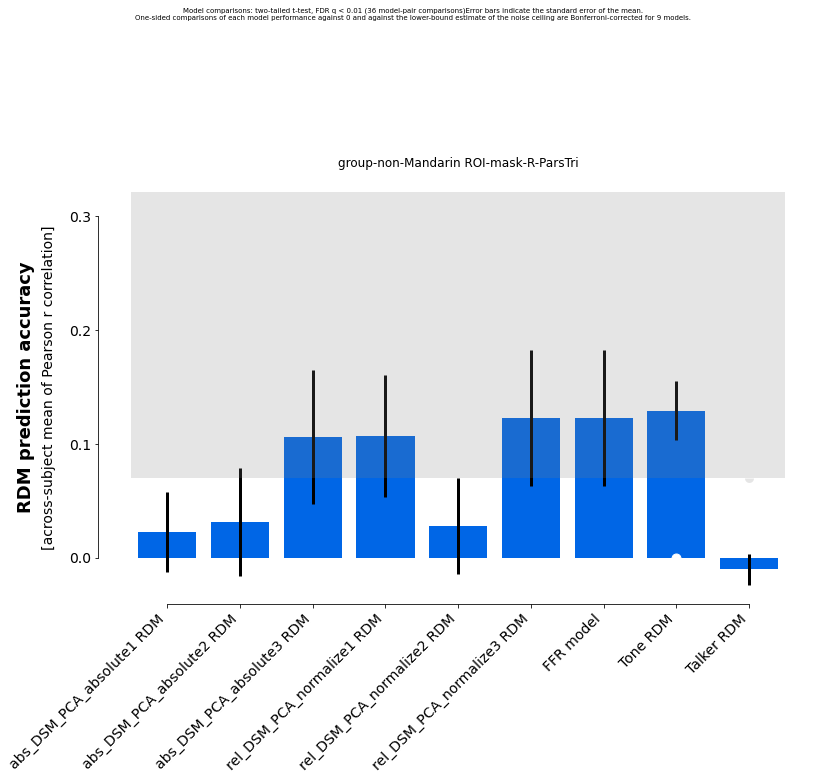

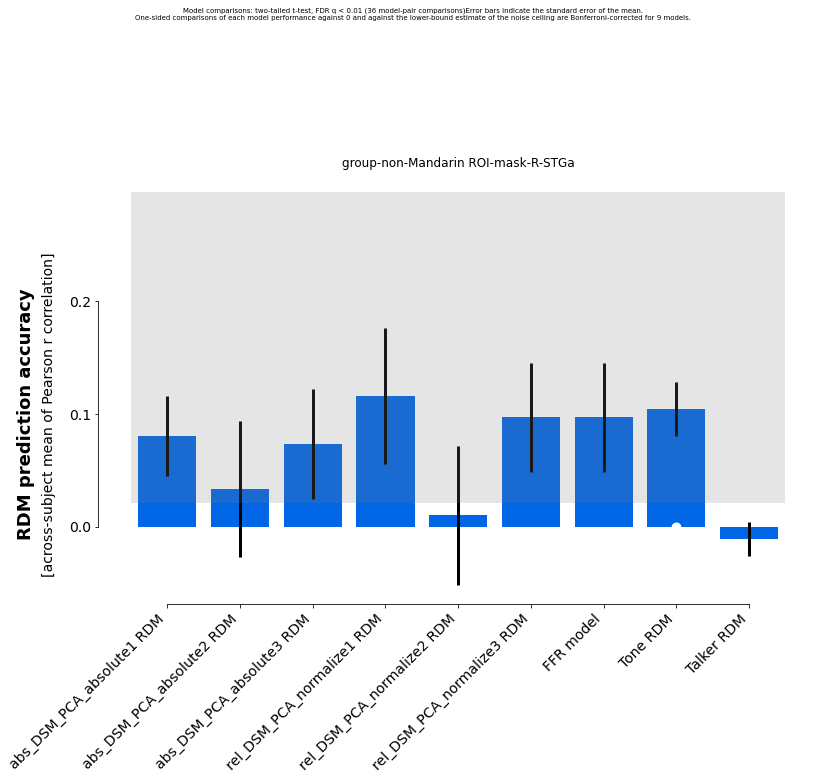

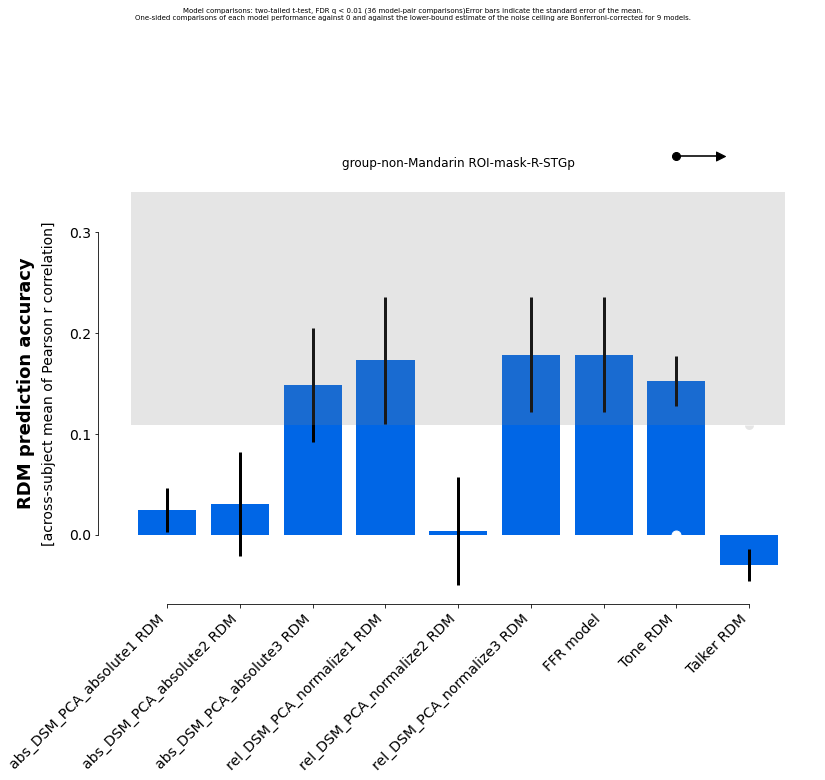

In [52]:
'''
group = 'Mandarin'
ROI = 'mask-R-ParsTri'
'''
for group in np.unique(runall_rdms.rdm_descriptors['group']):
    for ROI in np.unique(runall_rdms.rdm_descriptors['ROI']):
        print(f'group-{group} ROI-{ROI}')
        results_grr = rsatoolbox.inference.eval_fixed(all_models, 
                                                      runall_rdms.subset('group', value=group).subset('ROI',value=ROI),  
                                                      method='corr',)
        fig, ax1, ax2 = rsatoolbox.vis.plot_model_comparison(results_grr);
        ax1.set_title(f'group-{group} ROI-{ROI}');
        ax1.axes.set_xticklabels(ax1.xaxis.get_majorticklabels(), ha="right")
        #results_grr.save(f'results-eval/run-all/results-eval_run-all_group-{group}_ROI-{ROI}.hdf5',overwrite=True)
        

In [137]:
print(results_mand.summary())

Results for running fixed evaluation for corr on 9 models:

Model                      |   Eval ± SEM   | p (against 0) | p (against NC) |
------------------------------------------------------------------------------
abs_DSM_PCA_absolute1 RDM  |  0.016 ± 0.008 |        0.021  |       < 0.001  |
abs_DSM_PCA_absolute2 RDM  | -0.038 ± 0.008 |        1.000  |       < 0.001  |
abs_DSM_PCA_absolute3 RDM  |  0.041 ± 0.009 |      < 0.001  |       < 0.001  |
rel_DSM_PCA_normalize1 RDM |  0.047 ± 0.009 |      < 0.001  |       < 0.001  |
rel_DSM_PCA_normalize2 RDM | -0.043 ± 0.009 |        1.000  |       < 0.001  |
rel_DSM_PCA_normalize3 RDM |  0.043 ± 0.009 |      < 0.001  |       < 0.001  |
FFR model                  |  0.043 ± 0.009 |      < 0.001  |       < 0.001  |
Tone RDM                   |  0.027 ± 0.004 |      < 0.001  |       < 0.001  |
Talker RDM                 |  0.002 ± 0.004 |        0.354  |       < 0.001  |

p-values are based on uncorrected t-tests


## TEST: Categorical model comparisons

In [72]:
results_1 = []
for roi in mask_list:
    print(roi)
    results_1.append(rsatoolbox.inference.eval_fixed(cat_models, 
                                                     runall_rdms.subset('ROI', value=roi).subset('group', value='non-Mandarin'), 
                                                     method='corr',))


mask-L-IC
mask-L-MGN
mask-L-HG
mask-L-PP
mask-L-PT
mask-L-STGp
mask-L-STGa
mask-L-ParsOp
mask-L-ParsTri
mask-R-IC
mask-R-MGN
mask-R-HG
mask-R-PP
mask-R-PT
mask-R-STGp
mask-R-STGa
mask-R-ParsOp
mask-R-ParsTri


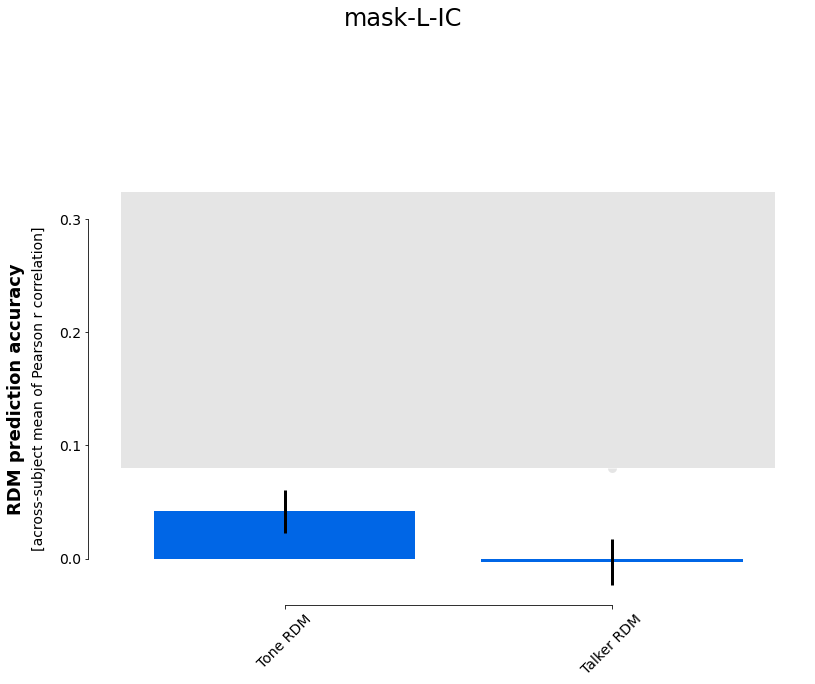

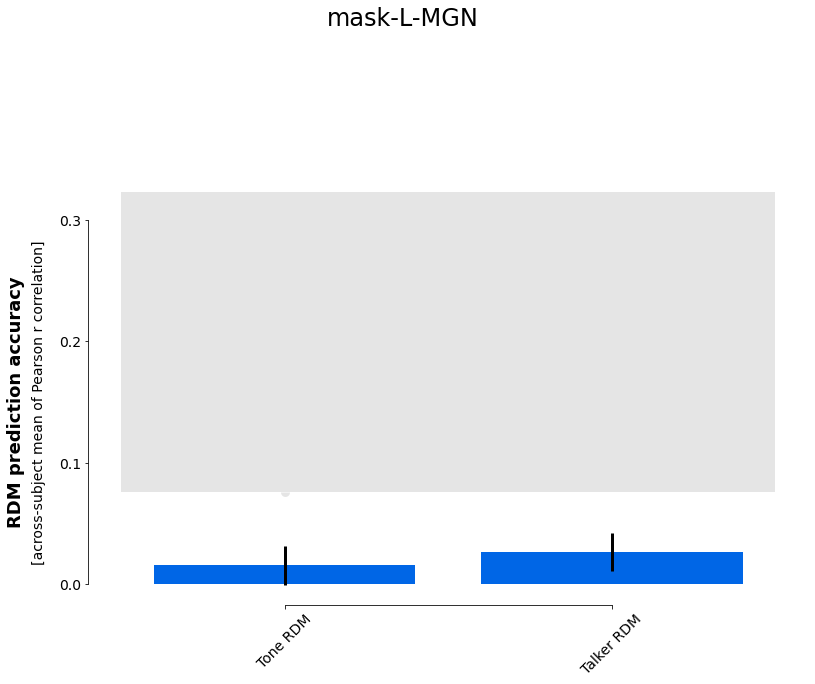

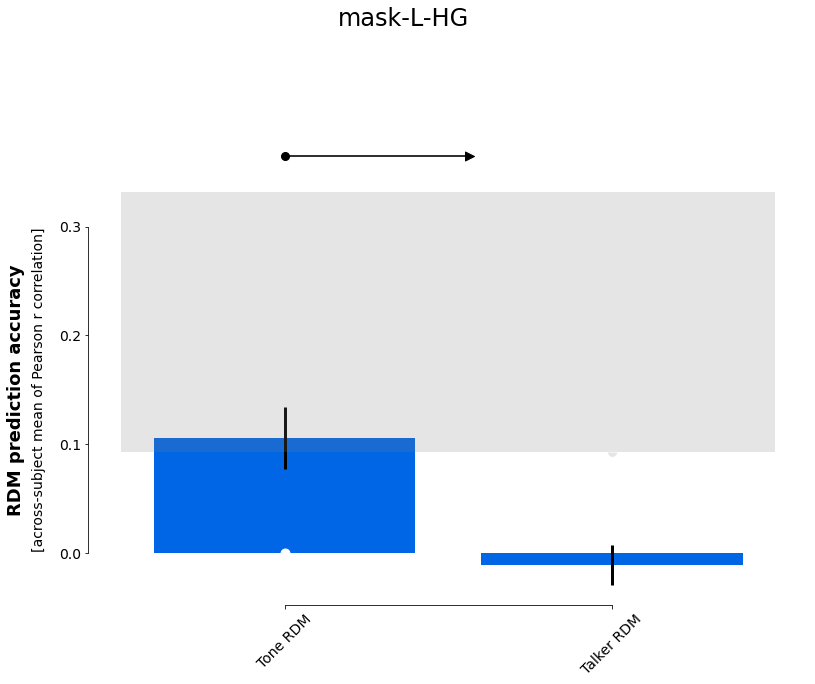

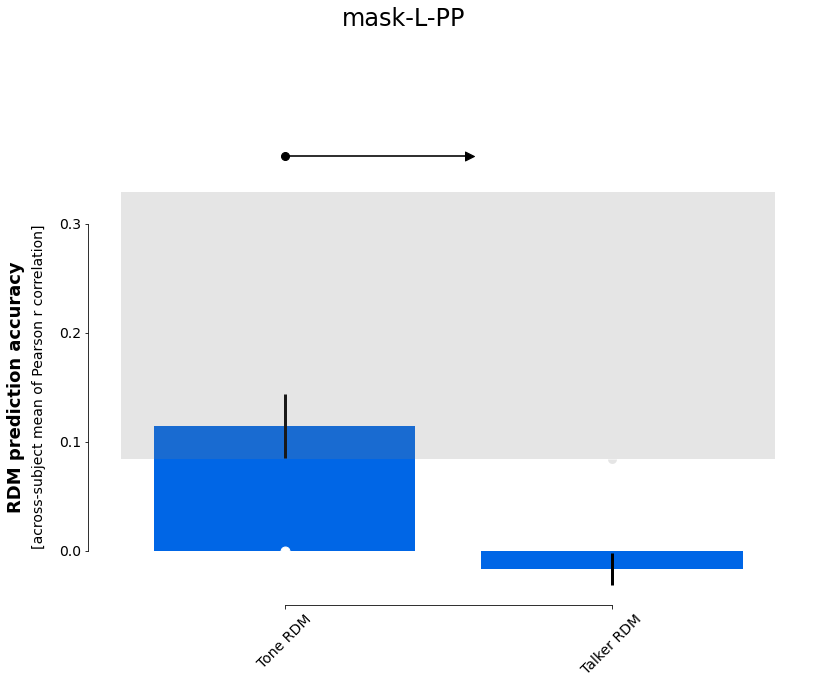

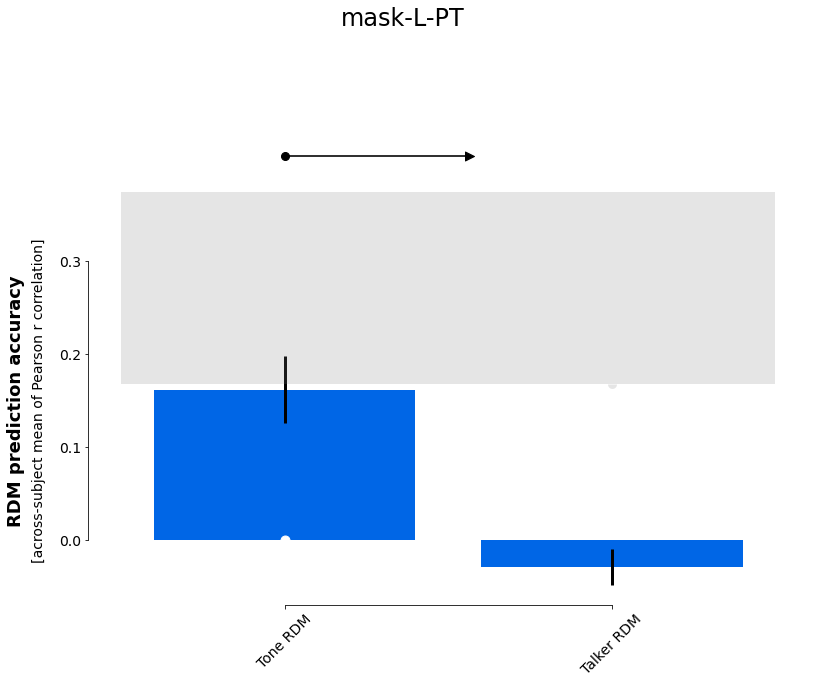

...

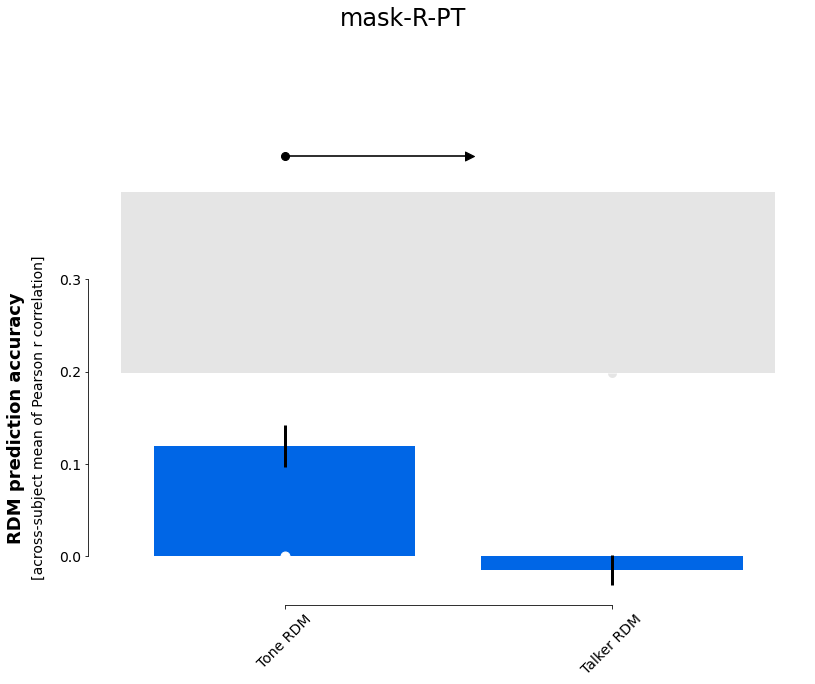

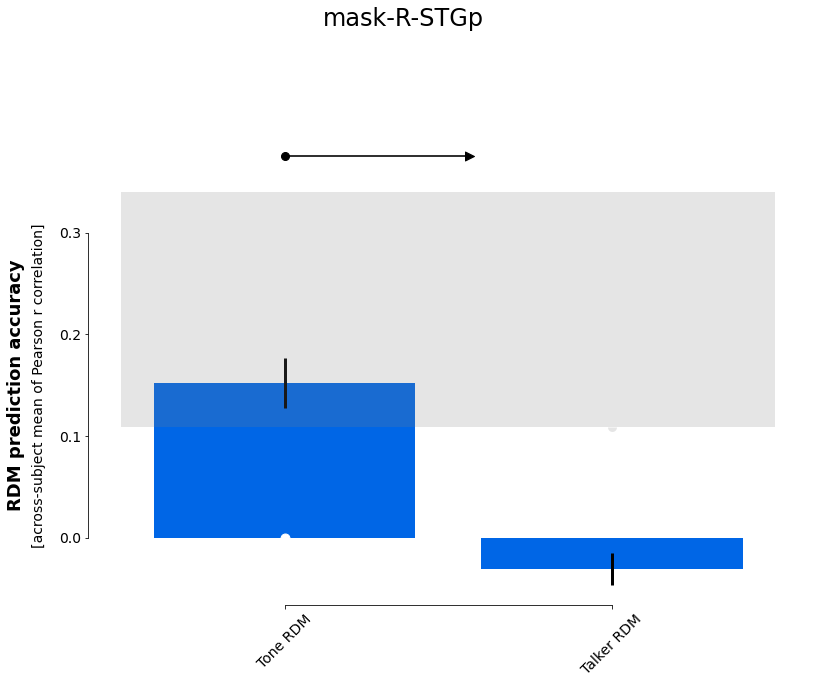

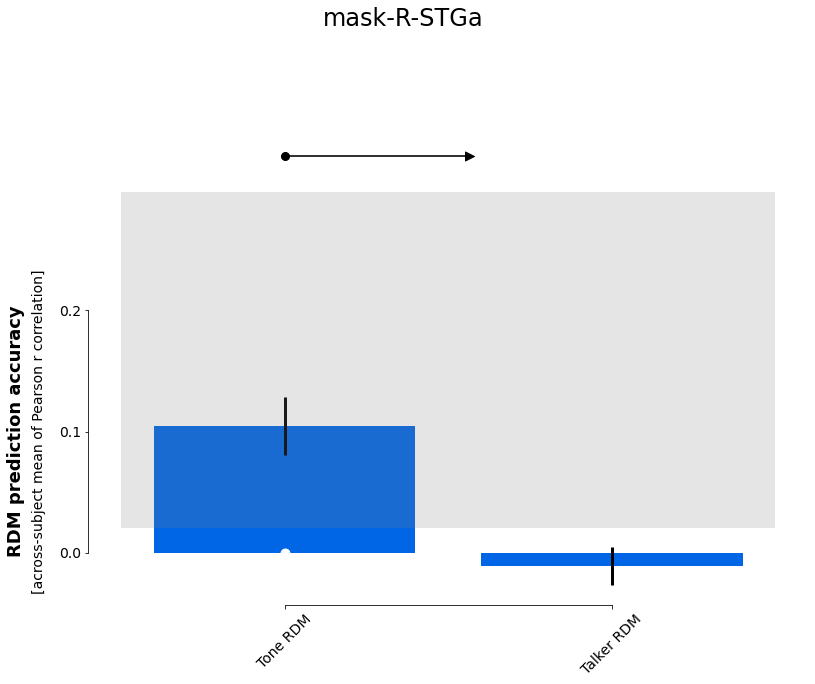

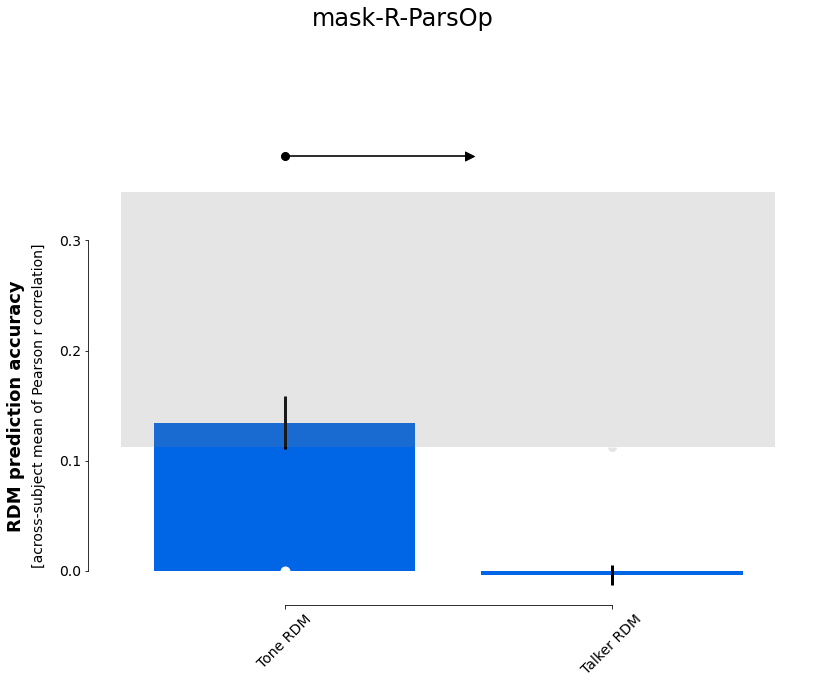

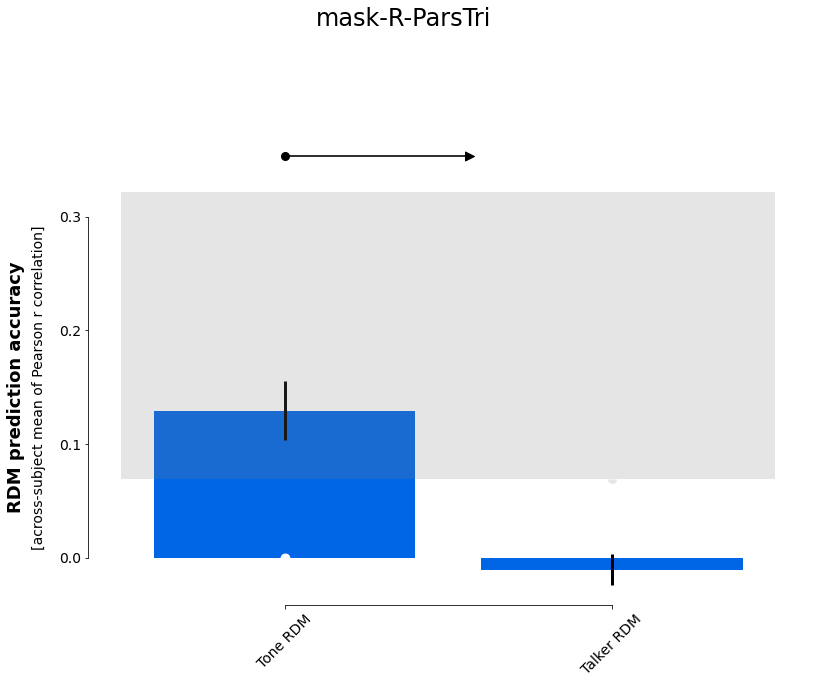

In [74]:
for rx, roi in enumerate(mask_list):
    fig = rsatoolbox.vis.plot_model_comparison(results_1[rx])
    fig[0].suptitle(roi, fontsize=24)

In [67]:
results_boot = rsatoolbox.inference.eval_dual_bootstrap(cat_models, runall_rdms, rdm_descriptor='ROI')

100%|██████████| 1000/1000 [01:08<00:00, 14.56it/s]


(<Figure size 900x720 with 2 Axes>, <Axes: >, <Axes: >)

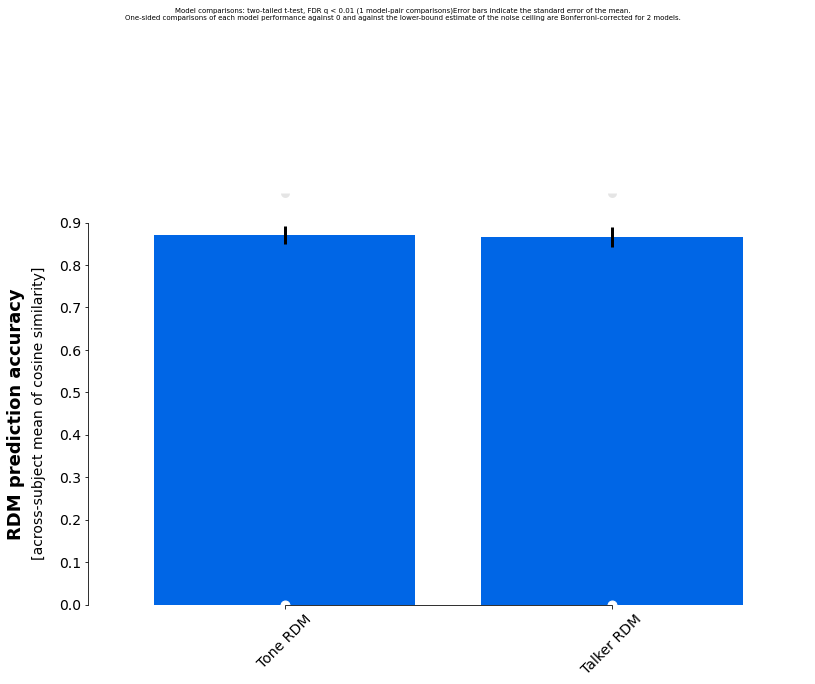

In [68]:
rsatoolbox.vis.plot_model_comparison(results_boot)

## WIP: Hierarchical representation tests

In [36]:
mean_rdms_mand

rsatoolbox.rdm.RDMs(
dissimilarity_measure = 
None
dissimilarities = 
[[2.04209023 2.08695517 2.49758415 ... 2.0108979  2.29537633 1.82827784]
 [2.2918071  2.07262579 2.01408625 ... 1.83586428 1.87229665 2.09156499]
 [2.54109249 2.36250598 2.12917018 ... 2.14209107 2.23974482 2.12465291]
 ...
 [2.28377883 2.19849706 2.22555384 ... 1.92955598 2.2992466  2.07417637]
 [2.35288476 2.38194934 2.18907232 ... 1.96995006 2.32131258 2.15103696]
 [2.37349142 2.34352762 2.23162261 ... 1.9869308  2.33359403 2.20375289]]
descriptors = 
{}
rdm_descriptors = 
{'ROI': ['mask-L-IC', 'mask-L-MGN', 'mask-L-HG', 'mask-L-PP', 'mask-L-PT', 'mask-L-STGp', 'mask-L-STGa', 'mask-L-ParsOp', 'mask-L-ParsTri', 'mask-R-IC', 'mask-R-MGN', 'mask-R-HG', 'mask-R-PP', 'mask-R-PT', 'mask-R-STGp', 'mask-R-STGa', 'mask-R-ParsOp', 'mask-R-ParsTri'], 'group': ['Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin', 'Mandarin',

In [37]:
neural_models_dict = {}

neural_models_dict['Mandarin'] = [ModelFixed(x, rdm=mean_rdms_mand.subset('group', value='Mandarin').subset('ROI',value=x)) for x in np.unique(mean_rdms_mand.rdm_descriptors['ROI'])]
neural_models_dict['non-Mandarin'] = [ModelFixed(x, rdm=mean_rdms_nman.subset('group', value='non-Mandarin').subset('ROI',value=x)) for x in np.unique(mean_rdms_nman.rdm_descriptors['ROI'])]


group-Mandarin ROI-mask-L-HG
group-Mandarin ROI-mask-L-IC
group-Mandarin ROI-mask-L-MGN
group-Mandarin ROI-mask-L-PP
group-Mandarin ROI-mask-L-PT
group-Mandarin ROI-mask-L-ParsOp
group-Mandarin ROI-mask-L-ParsTri
group-Mandarin ROI-mask-L-STGa
group-Mandarin ROI-mask-L-STGp
group-Mandarin ROI-mask-R-HG
group-Mandarin ROI-mask-R-IC
group-Mandarin ROI-mask-R-MGN
group-Mandarin ROI-mask-R-PP
group-Mandarin ROI-mask-R-PT
group-Mandarin ROI-mask-R-ParsOp
group-Mandarin ROI-mask-R-ParsTri
group-Mandarin ROI-mask-R-STGa
group-Mandarin ROI-mask-R-STGp
group-non-Mandarin ROI-mask-L-HG
group-non-Mandarin ROI-mask-L-IC
group-non-Mandarin ROI-mask-L-MGN
group-non-Mandarin ROI-mask-L-PP


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/rsatoolbox/vis/model_plot.py:282: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12.5, 10))


group-non-Mandarin ROI-mask-L-PT
group-non-Mandarin ROI-mask-L-ParsOp
group-non-Mandarin ROI-mask-L-ParsTri
group-non-Mandarin ROI-mask-L-STGa
group-non-Mandarin ROI-mask-L-STGp
group-non-Mandarin ROI-mask-R-HG
group-non-Mandarin ROI-mask-R-IC
group-non-Mandarin ROI-mask-R-MGN
group-non-Mandarin ROI-mask-R-PP
group-non-Mandarin ROI-mask-R-PT
group-non-Mandarin ROI-mask-R-ParsOp
group-non-Mandarin ROI-mask-R-ParsTri
group-non-Mandarin ROI-mask-R-STGa
group-non-Mandarin ROI-mask-R-STGp


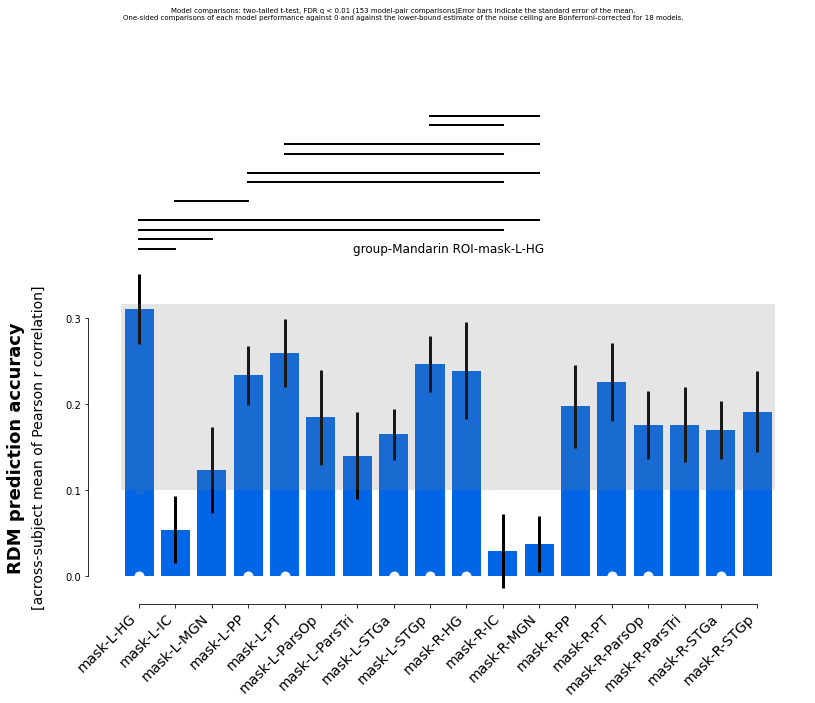

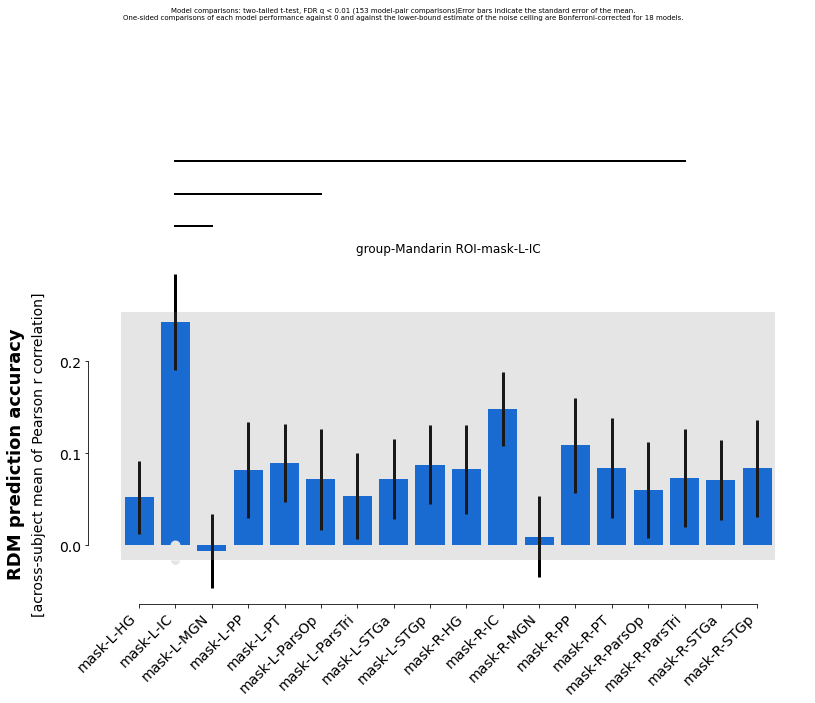

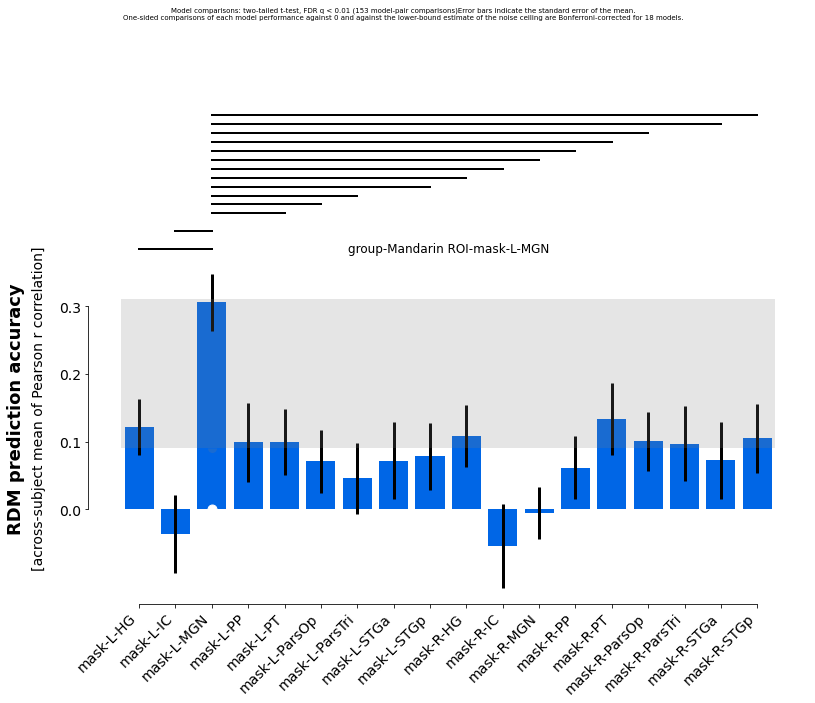

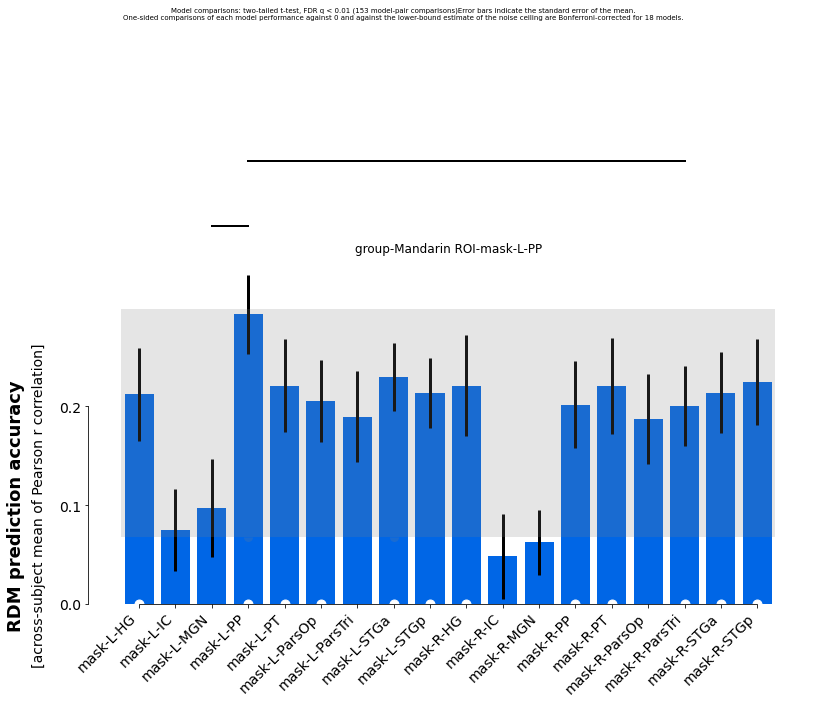

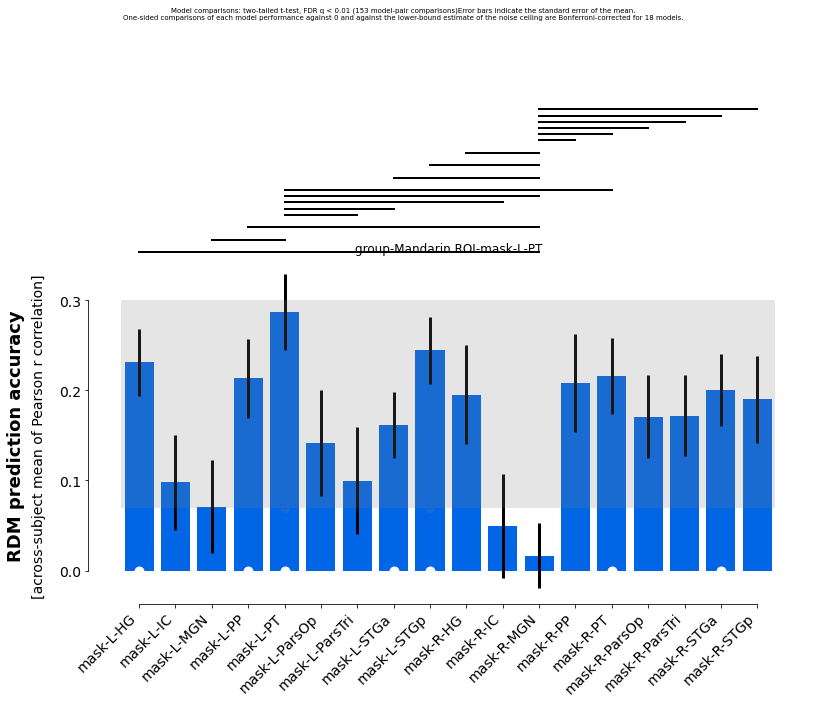

...

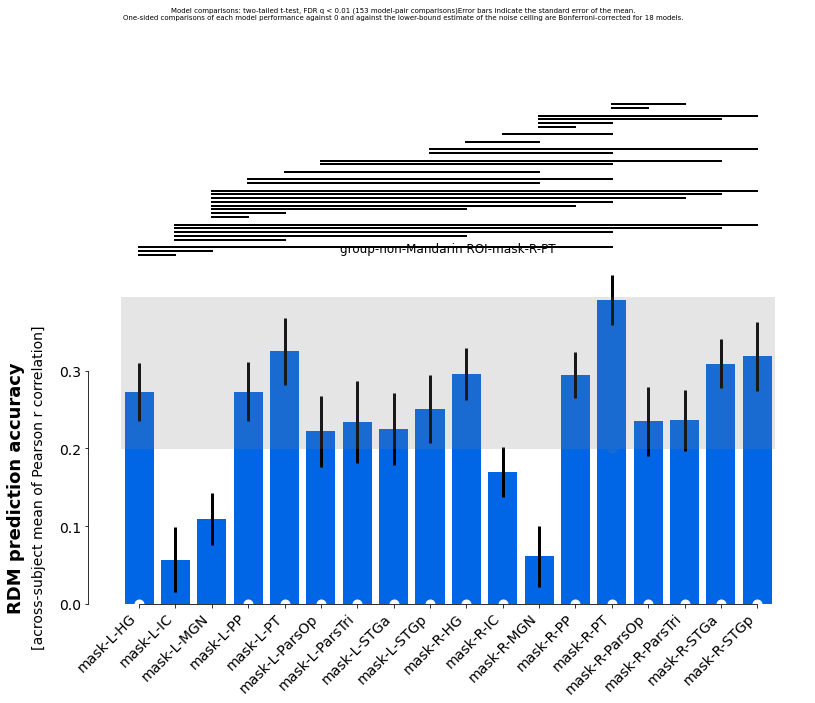

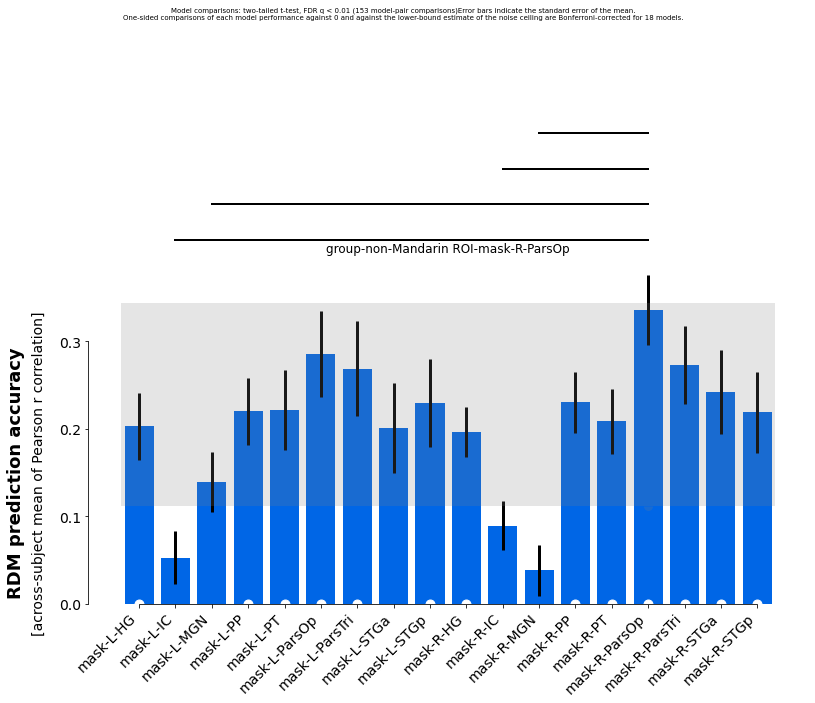

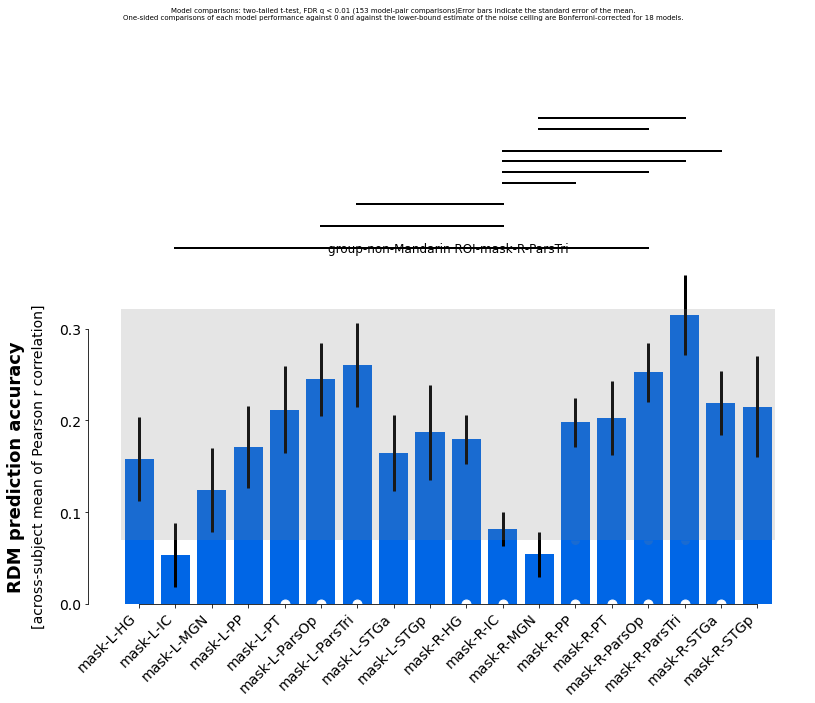

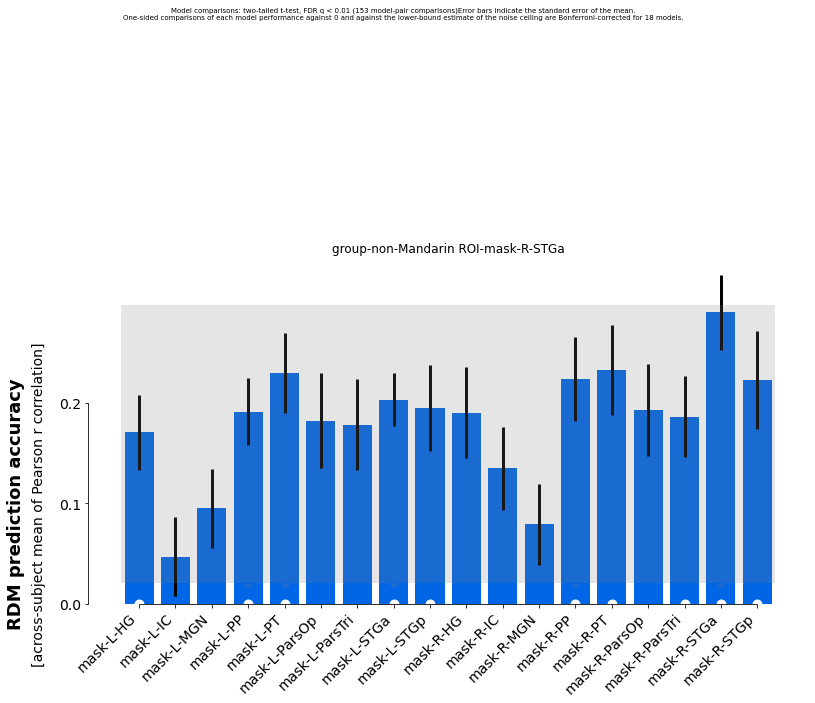

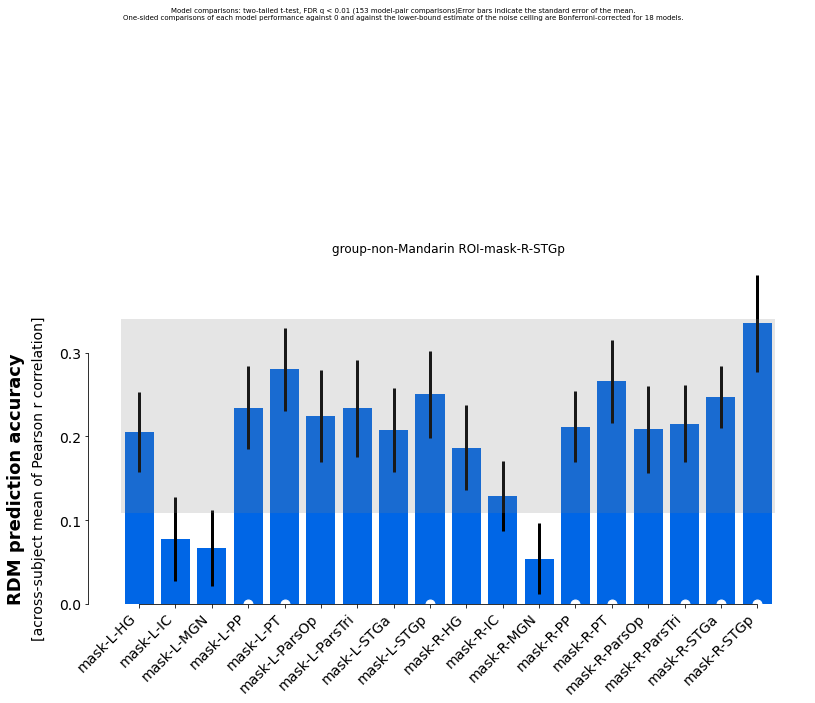

In [38]:
for group in np.unique(runall_rdms.rdm_descriptors['group']): # ['non-Mandarin']:# 
    for ROI in np.unique(runall_rdms.rdm_descriptors['ROI']):
        #if 'PP' in ROI:
        #    continue
        print(f'group-{group} ROI-{ROI}')
        results_grr = rsatoolbox.inference.eval_fixed(neural_models_dict[group], 
                                                      runall_rdms.subset('group', value=group).subset('ROI',value=ROI),  
                                                      method='corr',)
        fig, ax1, ax2 = rsatoolbox.vis.plot_model_comparison(results_grr,
                                                             test_pair_comparisons='nili', #False, # getting a bug from plot_arrow()
                                                            );
        ax1.set_title(f'group-{group} ROI-{ROI}');
        ax1.axes.set_xticklabels(ax1.xaxis.get_majorticklabels(), ha="right")